<a href="https://colab.research.google.com/github/balavignesh-ks/Cloud-Machine-Learning/blob/main/Group_7_Diabetes_Prediction_Machine_Learning_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1><b>Diabetes Prediction Machine Learning Project - Group 7</b></h1>



---



Balavignesh Kunkulagunta Sanghameswar - 22220445 <br>
Ashutosh Ramesh Jadhav - 22183868 <br>
Manvendar Singh Sekhawat - 22212051 <br>


# Importing the libraries

In [1]:
# Import libraries
import numpy as np # for linear algebra
import pandas as pd # for data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # for data visualization
import matplotlib.pyplot as plt # to plot data visualization charts
import statsmodels.api as sm
from collections import Counter

# Modeling Libraries
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, mean_squared_error, r2_score, roc_auc_score, roc_curve, classification_report
from sklearn.preprocessing import QuantileTransformer, scale, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve, train_test_split, KFold
from sklearn.svm import SVC
from sklearn.utils import parallel_backend
from imblearn.combine import SMOTEENN
from concurrent.futures import ThreadPoolExecutor

import warnings
import os

warnings.simplefilter(action='ignore')
sns.set()
plt.style.use("ggplot")
%matplotlib inline

# Dataset 1

## Reading Dataset

In [2]:
data1 = pd.read_csv('diabetes_prediction_dataset.csv')
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   gender               100000 non-null  object 
 1   age                  100000 non-null  float64
 2   hypertension         100000 non-null  int64  
 3   heart_disease        100000 non-null  int64  
 4   smoking_history      100000 non-null  object 
 5   bmi                  100000 non-null  float64
 6   HbA1c_level          100000 non-null  float64
 7   blood_glucose_level  100000 non-null  int64  
 8   diabetes             99995 non-null   float64
dtypes: float64(4), int64(3), object(2)
memory usage: 6.9+ MB


## Data Cleaning

Checking each column and displaying unique values

In [3]:
# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: gender
['Female' 'Male' 'Animal' 'Fermale' 'Other']

Column: age
[ 8.00e+01  5.40e+01  2.80e+01  3.60e+01  7.60e+01  2.00e+01  4.40e+01
  7.90e+01  4.20e+01  3.20e+01  5.30e+01  7.80e+01  6.70e+01  1.50e+01
  3.70e+01  4.00e+01  5.00e+00  6.90e+01  7.20e+01  4.00e+00  3.00e+01
  4.50e+01  4.30e+01  5.00e+01  4.10e+01  2.60e+01  3.40e+01  7.30e+01
  7.70e+01  6.60e+01  2.90e+01  6.00e+01  3.80e+01  3.00e+00  5.70e+01
  7.40e+01  1.90e+01  4.60e+01  2.10e+01  5.90e+01  2.70e+01  1.30e+01
  5.60e+01  2.00e+00  7.00e+00  1.10e+01  6.00e+00  5.50e+01  9.00e+00
  6.20e+01  4.70e+01  1.20e+01  6.80e+01  7.50e+01  2.20e+01  5.80e+01
  1.80e+01  2.40e+01  1.70e+01  2.50e+01  8.00e-02  3.30e+01  1.60e+01
  6.10e+01  3.10e+01  8.00e+00  4.90e+01  3.90e+01  6.50e+01  1.40e+01
  7.00e+01  5.60e-01  4.80e+01  5.10e+01  7.10e+01  8.80e-01  6.40e+01
  6.30e+01  5.20e+01  1.60e-01  1.00e+01  3.50e+01  2.30e+01  6.40e-01
  1.16e+00  1.64e+00  7.20e-01  1.88e+00  1.32e+00  8.00e-01  1.24e+00
  1.

Checking each column value counts

In [4]:
# Iterate through each column and display value counts
for column in data1.columns:
    print(f"Column: {column}")
    print(data1[column].value_counts())
    print()

Column: gender
gender
Female     58550
Male       41427
Other         18
Animal         3
Fermale        2
Name: count, dtype: int64

Column: age
age
 80.0     5621
 51.0     1618
 47.0     1574
 48.0     1568
 53.0     1542
          ... 
-18.0        1
-59.0        1
 340.0       1
 370.0       1
 510.0       1
Name: count, Length: 107, dtype: int64

Column: hypertension
hypertension
0    92515
1     7485
Name: count, dtype: int64

Column: heart_disease
heart_disease
0    96058
1     3942
Name: count, dtype: int64

Column: smoking_history
smoking_history
No Info        35816
never          35095
former          9352
current         9286
not current     6447
ever            4004
Name: count, dtype: int64

Column: bmi
bmi
27.32    25495
23.00      103
27.12      101
27.80      100
24.96      100
         ...  
58.23        1
48.18        1
55.57        1
57.07        1
60.52        1
Name: count, Length: 4247, dtype: int64

Column: HbA1c_level
HbA1c_level
6.6    8540
5.7    8413
6.5   

Checking related columns where gender is Fermale or Animal

In [5]:
# Check rows where 'gender' is 'Fermale' or 'Animal' and display related columns
related_columns = ['hypertension', 'heart_disease', 'smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'age','diabetes', 'gender']
related_data = data1[(data1['gender'] == 'Fermale') | (data1['gender'] == 'Animal')][related_columns]
print(related_data)

      hypertension  heart_disease smoking_history    bmi  HbA1c_level  \
247              0              0            ever  27.32          6.6   
774              0              0           never  34.17          4.8   
2086             0              0           never  19.89          4.8   
3295             0              0           never  28.86          4.8   
5065             0              0         No Info  27.32          6.6   

      blood_glucose_level   age  diabetes   gender  
247                   160  48.0      -1.0   Animal  
774                   159  41.0      -1.0  Fermale  
2086                  155  18.0      -1.0  Fermale  
3295                  158  19.0      -1.0   Animal  
5065                   85   3.0      -1.0   Animal  


Since the Fermale looks like an obvious typing mistake. We are changing it to Female.

In [6]:
# Replace 'Fermale' with 'Female' in the 'gender' column
data1['gender'] = data1['gender'].replace('Fermale', 'Female')

# Check the unique values in the 'gender' column to confirm the change
print(data1['gender'].value_counts())

gender
Female    58552
Male      41427
Other        18
Animal        3
Name: count, dtype: int64


We'll only focus on Male and Female genders. Other and Animal Genders are dropped.

In [7]:
# Drop rows with 'Other' and 'Animal' values in the 'gender' column
data1 = data1[data1['gender'] != 'Other']
data1 = data1[data1['gender'] != 'Animal']

# Check the updated value counts in the 'gender' column
print(data1['gender'].value_counts())

gender
Female    58552
Male      41427
Name: count, dtype: int64


Checking related columns where age is less than 0 and greater than 100

In [8]:
# Check rows where 'age' is less than 0 and greater than 100 and display related columns
related_columns = ['hypertension', 'heart_disease', 'smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'gender','diabetes', 'age']
related_data = data1[(data1['age'] <= 0) | (data1['age'] >= 100) ][related_columns]
print(related_data)

       hypertension  heart_disease smoking_history    bmi  HbA1c_level  \
7312              0              0           never  37.91          5.8   
8167              0              0            ever  27.32          3.5   
10249             0              0         current  19.60          6.6   
13954             0              0           never  35.49          5.0   
17214             0              0         No Info  39.86          6.5   

       blood_glucose_level  gender  diabetes    age  
7312                   126    Male       NaN  -18.0  
8167                   200    Male       NaN  -59.0  
10249                  145    Male       NaN  340.0  
13954                  160  Female       NaN  370.0  
17214                  200  Female       NaN  510.0  


Dropping the rows where age is less than 0 and greater than 100

In [9]:
# Drop rows with negative values and values greater than 100 in the 'age' column
data1 = data1[(data1['age'] >= 0) & (data1['age'] <= 100)]

# Check the updated value counts in the 'age' column
print(data1['age'].value_counts())

age
80.00    5621
51.00    1618
47.00    1572
48.00    1567
49.00    1541
         ... 
0.48       83
1.00       83
0.40       66
0.16       59
0.08       36
Name: count, Length: 102, dtype: int64


Checking related columns where diabetes is -1 or Nan

In [10]:
# Check rows where 'diabetes' is -1 or NaN and display related columns
related_columns = ['age', 'hypertension', 'heart_disease', 'smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level', 'gender', 'diabetes']
related_data = data1[(data1['diabetes'] == -1) | data1['diabetes'].isna()][related_columns]
print(related_data)

       age  hypertension  heart_disease smoking_history    bmi  HbA1c_level  \
774   41.0             0              0           never  34.17          4.8   
2086  18.0             0              0           never  19.89          4.8   

      blood_glucose_level  gender  diabetes  
774                   159  Female      -1.0  
2086                  155  Female      -1.0  


Imputing the -1 in diabetes with most frequent value in that column

In [11]:
mode_value = data1['diabetes'].mode()[0]
data1['diabetes'] = data1['diabetes'].replace(-1, mode_value)

Countplots

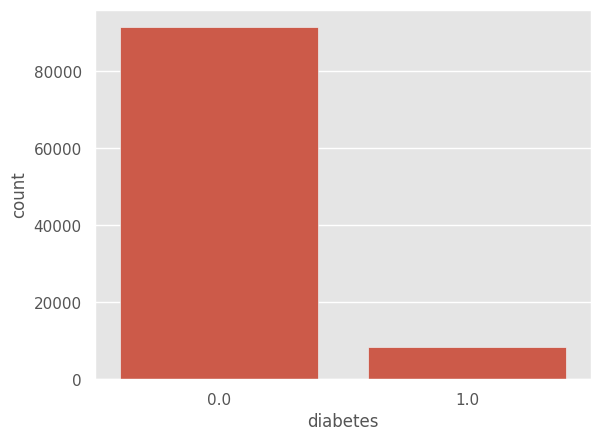

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x=data1['diabetes'],data=data1)
plt.show()

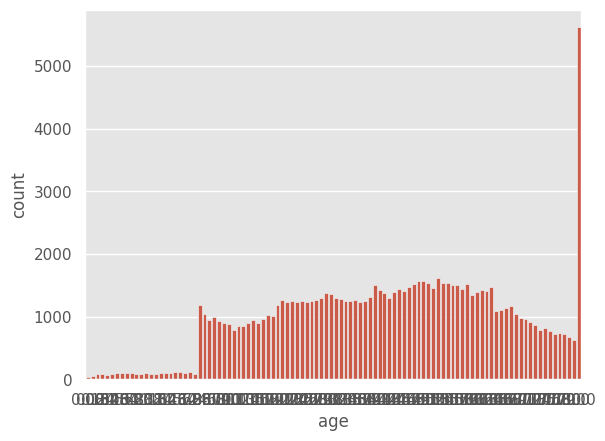

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x=data1['age'],data=data1)
plt.show()

Changing age to integer

In [14]:
data1['age'] = data1['age'].astype(int)

In [15]:
data1['age'].unique()

array([80, 54, 28, 36, 76, 20, 44, 79, 42, 32, 53, 78, 67, 15, 37, 40,  5,
       69, 72,  4, 30, 45, 43, 50, 41, 26, 34, 73, 77, 66, 29, 60, 38,  3,
       57, 74, 19, 46, 21, 59, 27, 13, 56,  2,  7, 11,  6, 55,  9, 62, 47,
       12, 68, 75, 22, 58, 18, 24, 17, 25,  0, 33, 16, 61, 31,  8, 49, 39,
       65, 14, 70, 48, 51, 71, 64, 63, 52, 10, 35, 23,  1])

Removing Age = 0

In [16]:
data1 = data1[data1['age']!=0]

Checking smoking history for age less than or equal to 5

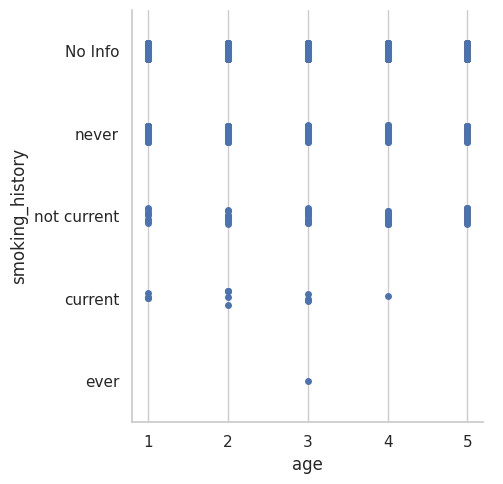

In [17]:
sns.set(style="whitegrid")
sns.catplot(x="age", y="smoking_history", data=data1.loc[data1['age'] <=5])
plt.show()

Removing the rows where age less than 5 has smoking history (ever or current)

In [18]:
data1 = data1[~((data1['age'] < 5) & data1['smoking_history'].isin(['ever', 'current']))]

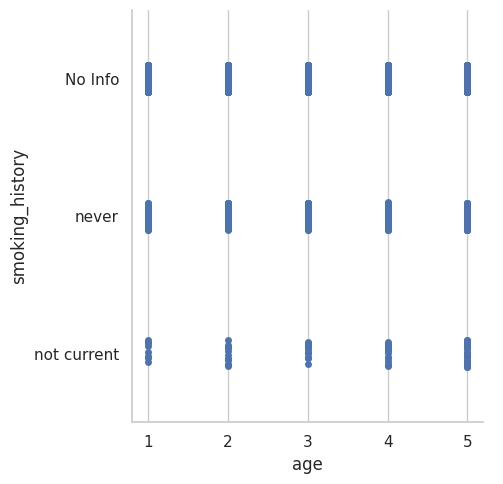

In [19]:
sns.set(style="whitegrid")
sns.catplot(x="age", y="smoking_history", data=data1.loc[data1['age'] <=5])
plt.show()

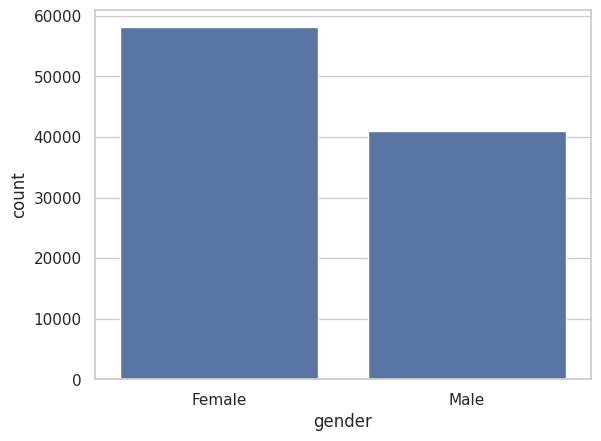

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x=data1['gender'],data=data1)
plt.show()

## Numerical Columns Distribution Visulization

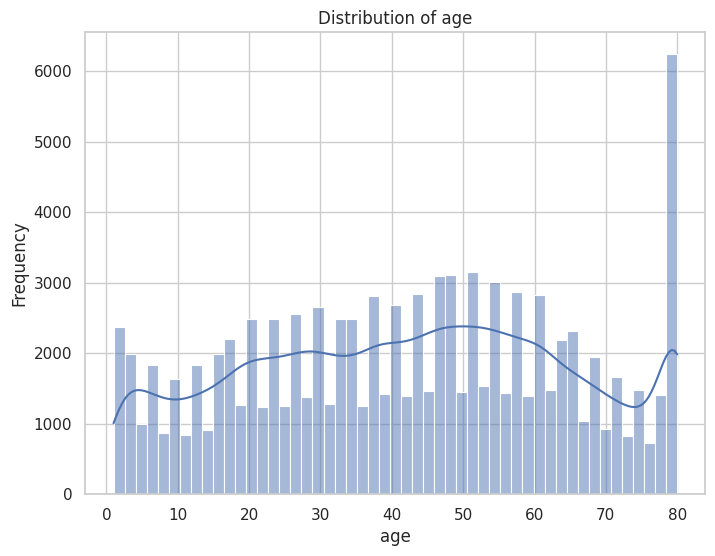

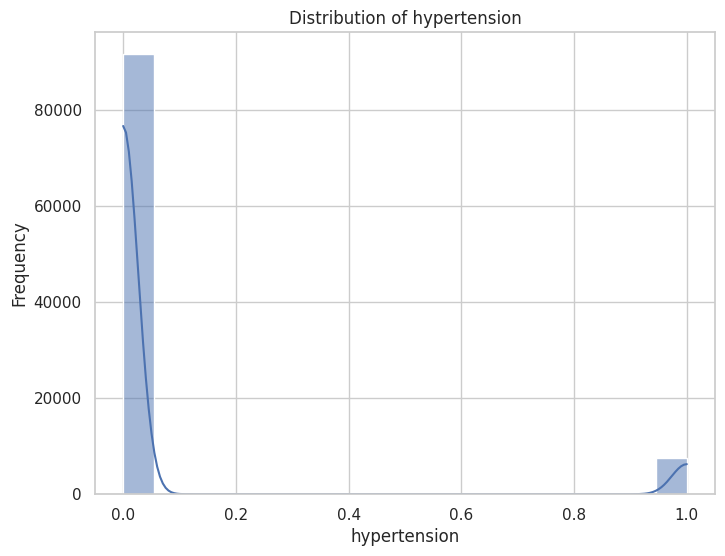

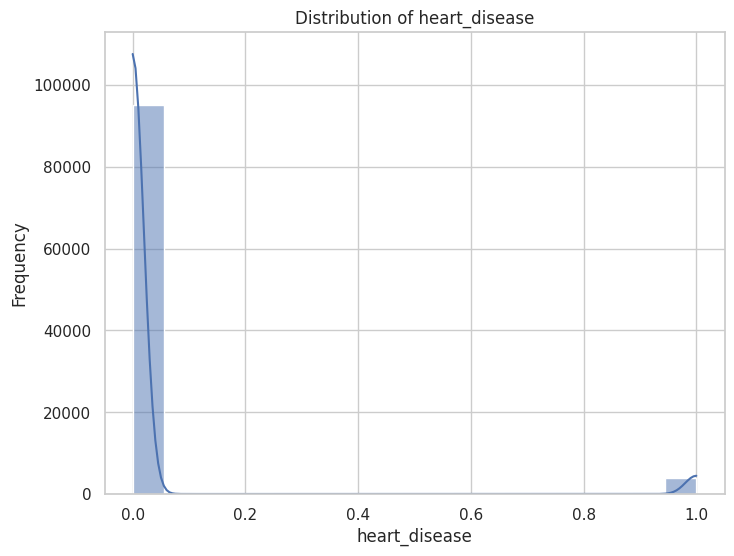

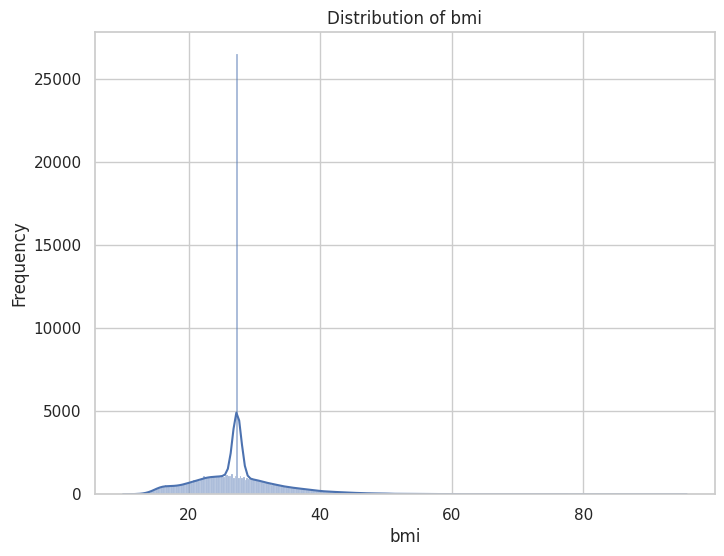

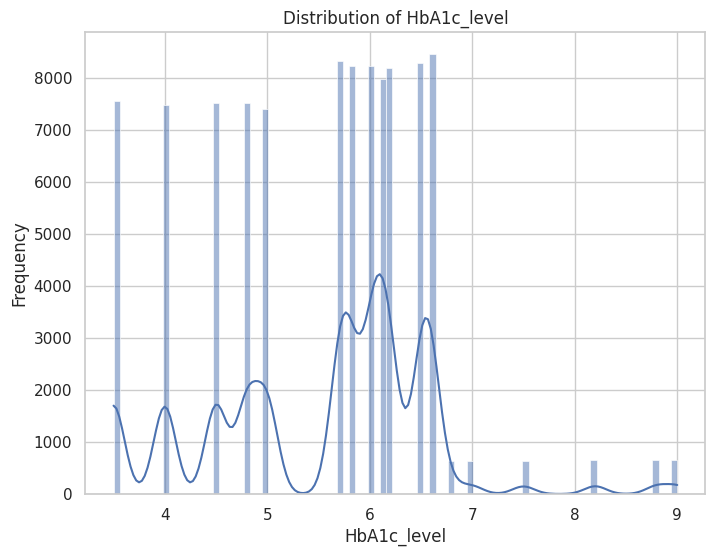

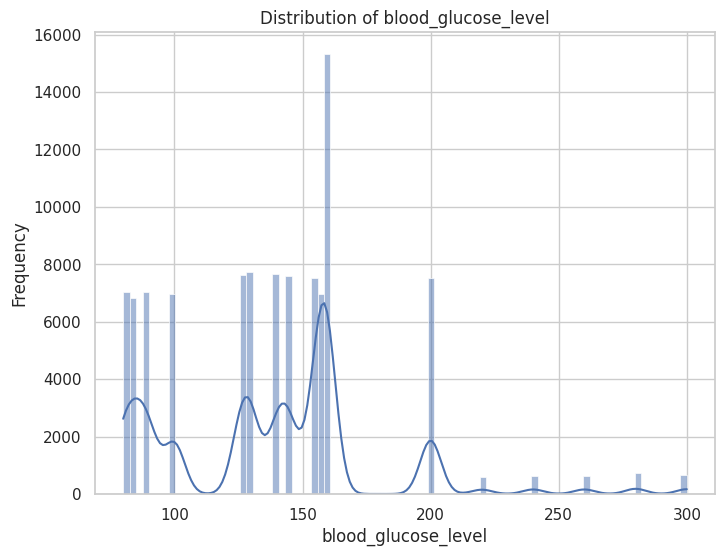

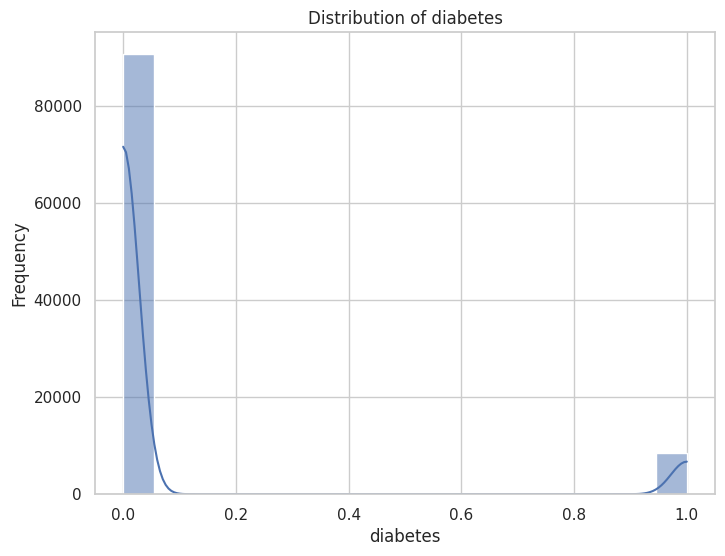

In [21]:
# Visualize the distribution of each numerical column
sns.set(style="whitegrid")

# Plot histograms of numerical columns
numerical_cols = data1.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data1[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

## Histplots

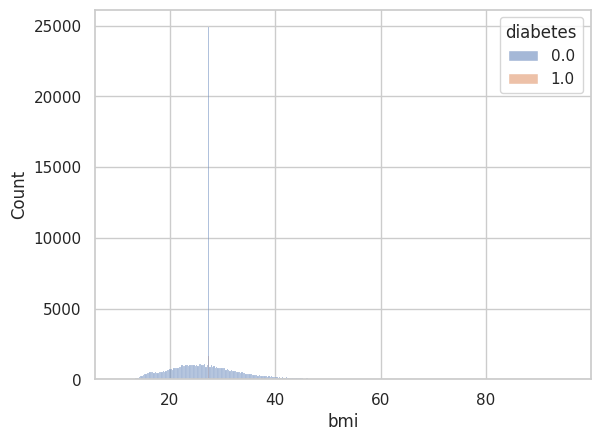

In [22]:
sns.histplot(data=data1,x='bmi',hue='diabetes')
plt.show()

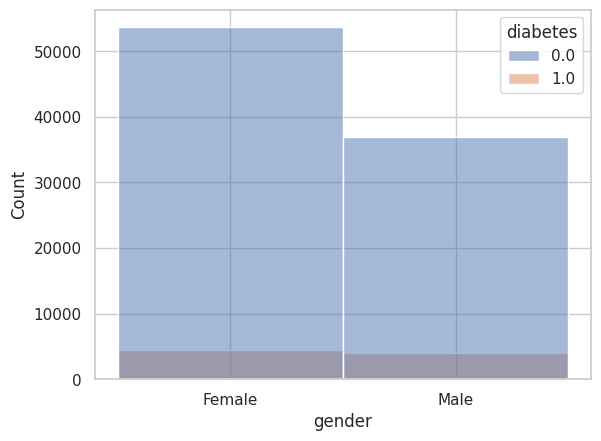

In [23]:
sns.histplot(data=data1,x='gender',hue='diabetes')
plt.show()

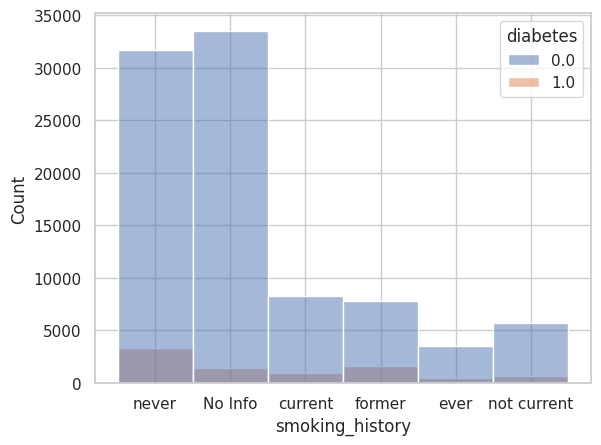

In [24]:
sns.histplot(data=data1,x='smoking_history',hue='diabetes')
plt.show()

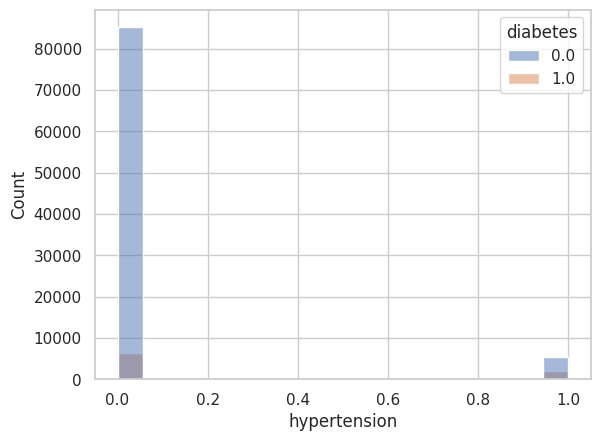

In [25]:
sns.histplot(data=data1,x='hypertension',hue='diabetes')
plt.show()

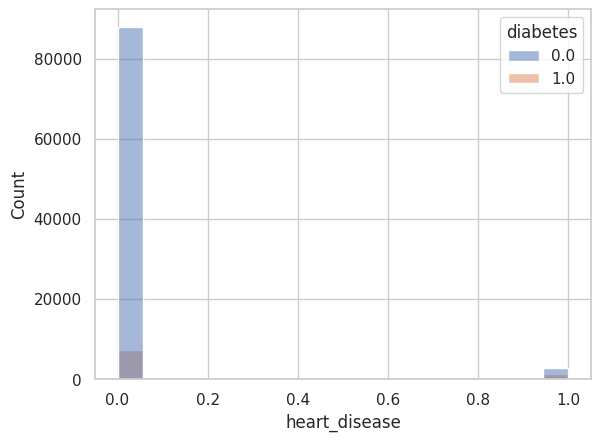

In [26]:
sns.histplot(data=data1,x='heart_disease',hue='diabetes')
plt.show()

## kdeplots

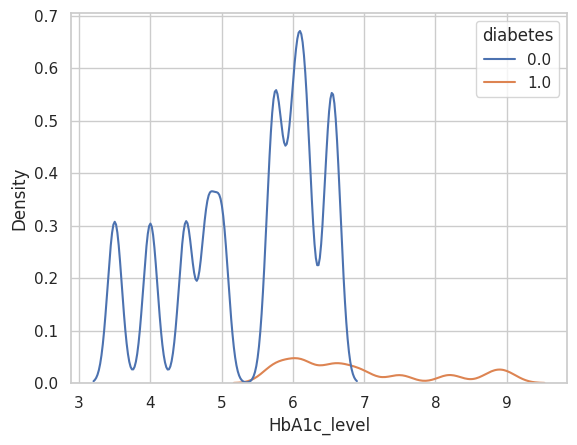

In [27]:
sns.kdeplot(data=data1,x='HbA1c_level',hue='diabetes')
plt.show()

In [28]:
data1['HbA1c_level'].value_counts()

HbA1c_level
6.6    8460
5.7    8320
6.5    8282
5.8    8228
6.0    8221
6.2    8199
6.1    7984
3.5    7560
4.5    7510
4.8    7509
4.0    7475
5.0    7405
8.8     661
8.2     661
9.0     654
7.5     643
6.8     642
7.0     634
Name: count, dtype: int64

## Outlier Detection with box plots and Removal

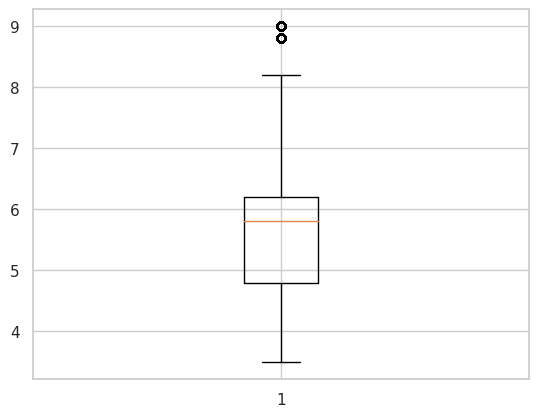

In [29]:
plt.boxplot(data1['HbA1c_level'])
plt.show()

In [30]:
mean = data1['HbA1c_level'].mean()
std  = data1['HbA1c_level'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data1 = data1[(data1['HbA1c_level'] >= lower_bound)
                & (data1['HbA1c_level'] <= upper_bound)]

Lower Bound : 3.386615742650185
Upper Bound : 7.671657013993056


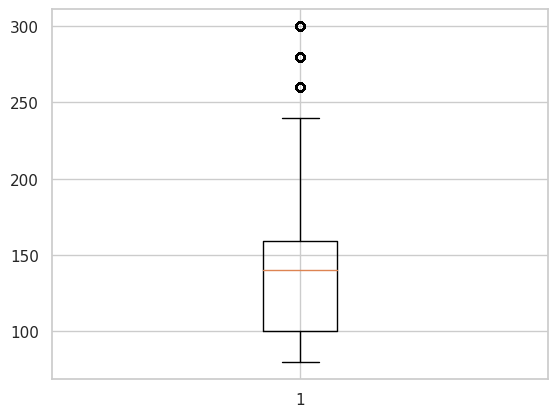

In [31]:
plt.boxplot(data1['blood_glucose_level'])
plt.show()

In [32]:
mean = data1['blood_glucose_level'].mean()
std  = data1['blood_glucose_level'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data1 = data1[(data1['blood_glucose_level'] >= lower_bound)
                & (data1['blood_glucose_level'] <= upper_bound)]

Lower Bound : 57.92068650027571
Upper Bound : 216.0514990939224


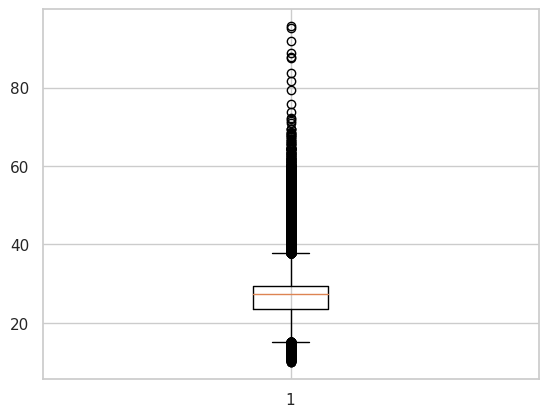

In [33]:
plt.boxplot(data1['bmi'])
plt.show()

In [34]:
mean = data1['bmi'].mean()
std  = data1['bmi'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data1 = data1[(data1['bmi'] >= lower_bound)
                & (data1['bmi'] <= upper_bound)]

Lower Bound : 14.275632918571706
Upper Bound : 40.12452425692331


In [35]:
data1['diabetes'].value_counts()

diabetes
0.0    86662
1.0     3405
Name: count, dtype: int64

## Checking Nulls and Duplicates

Checking Nulls in Dataset 1

In [36]:
data1.isnull().sum()

gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64

## One Hot Encoding for Categorical Columns

In [37]:
data1 = pd.get_dummies(data=data1, drop_first=True)
data1.head()

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes,gender_Male,smoking_history_current,smoking_history_ever,smoking_history_former,smoking_history_never,smoking_history_not current
0,80,0,1,25.19,6.6,140,0.0,False,False,False,False,True,False
1,54,0,0,27.32,6.6,80,0.0,False,False,False,False,False,False
2,28,0,0,27.32,5.7,158,0.0,True,False,False,False,True,False
3,36,0,0,23.45,5.0,155,0.0,False,True,False,False,False,False
4,76,1,1,20.14,4.8,155,0.0,True,True,False,False,False,False


Replacing False to 0 and True to 1

In [38]:
change_col =  ['gender_Male','smoking_history_ever','smoking_history_former','smoking_history_never','smoking_history_not current','smoking_history_current']
for col in change_col:
    data1[col] = data1[col].replace(False, 0)
    data1[col] = data1[col].replace(True, 1)
data1.head()

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes,gender_Male,smoking_history_current,smoking_history_ever,smoking_history_former,smoking_history_never,smoking_history_not current
0,80,0,1,25.19,6.6,140,0.0,0,0,0,0,1,0
1,54,0,0,27.32,6.6,80,0.0,0,0,0,0,0,0
2,28,0,0,27.32,5.7,158,0.0,1,0,0,0,1,0
3,36,0,0,23.45,5.0,155,0.0,0,1,0,0,0,0
4,76,1,1,20.14,4.8,155,0.0,1,1,0,0,0,0


## Correlation matrix

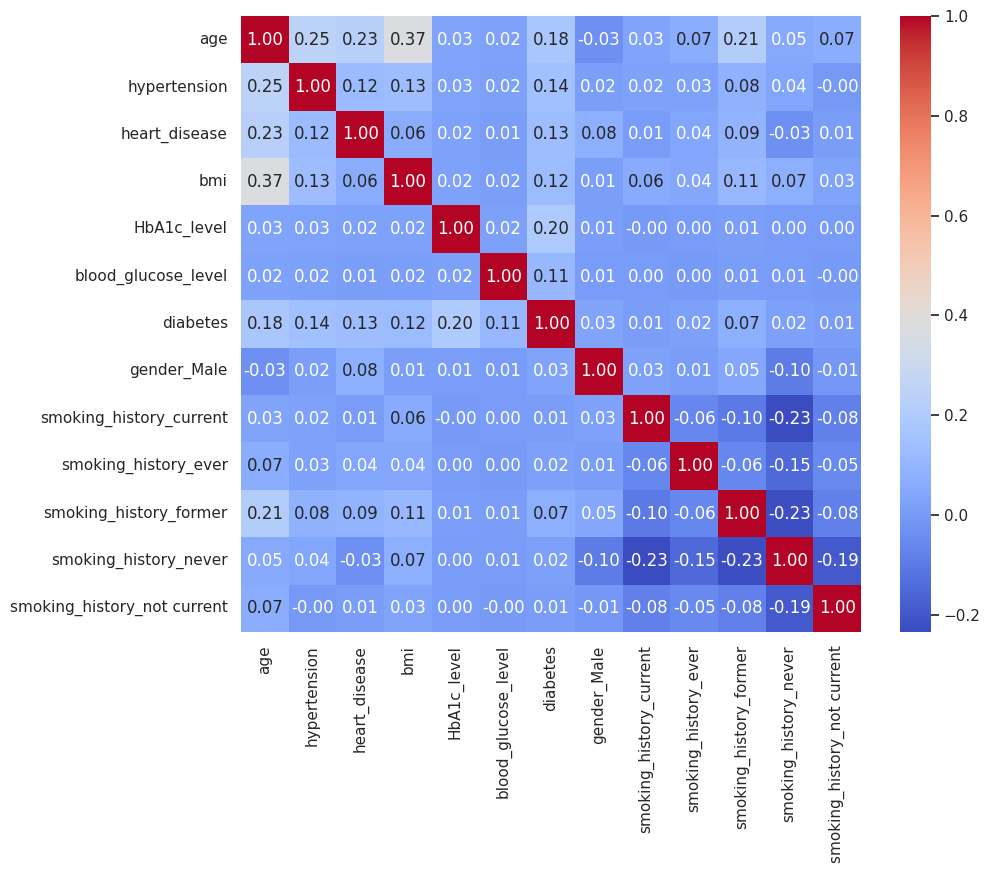

diabetes                       1.000000
HbA1c_level                    0.197458
age                            0.180198
hypertension                   0.144567
heart_disease                  0.129713
bmi                            0.124232
blood_glucose_level            0.108313
smoking_history_former         0.072108
gender_Male                    0.032747
smoking_history_ever           0.020581
smoking_history_never          0.018086
smoking_history_current        0.011052
smoking_history_not current    0.009265
Name: diabetes, dtype: float64


In [39]:
# Calculate correlation matrix
corr_matrix = data1.corr()

# Visualize correlation matrix (optional)
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

# Identify columns with high correlation to the target column
target_corr = corr_matrix['diabetes'].abs().sort_values(ascending=False)
print(target_corr)

# Dataset 2

Reading Dataset

In [40]:
data2 = pd.read_csv("diabetes_binary_health_indicators_BRFSS2015.csv")
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_binary       253678 non-null  float64
 1   HighBP                253680 non-null  int64  
 2   HighChol              253680 non-null  int64  
 3   CholCheck             253680 non-null  int64  
 4   BMI                   253680 non-null  int64  
 5   Smoker                253680 non-null  int64  
 6   Stroke                253680 non-null  int64  
 7   HeartDiseaseorAttack  253680 non-null  int64  
 8   PhysActivity          253680 non-null  int64  
 9   Fruits                253680 non-null  int64  
 10  HvyAlcoholConsump     253680 non-null  int64  
 11  AnyHealthcare         253680 non-null  int64  
 12  GenHlth               253680 non-null  int64  
 13  MentHlth              253680 non-null  int64  
 14  PhysHlth              253680 non-null  int64  
 15  

In [41]:
data2.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1,1,1,40,1,0,0,0,0,0,1,5,18,15,1,0,9.0,4,3
1,0.0,0,0,0,25,1,0,0,1,0,0,0,3,0,0,0,0,7.0,6,1
2,0.0,1,1,1,28,0,0,0,0,1,0,1,5,30,30,1,0,9.0,4,8
3,0.0,1,0,1,27,0,0,0,1,1,0,1,2,0,0,0,0,11.0,3,6
4,0.0,1,1,1,24,0,0,0,1,1,0,1,2,3,0,0,0,11.0,5,4


In [42]:
data2.describe()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,HvyAlcoholConsump,AnyHealthcare,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,253678.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253675.000000,253680.000000,253680.000000
mean,0.139338,0.429001,0.424121,0.962670,28.382364,0.443169,0.040571,0.094186,0.756544,0.634256,0.056197,0.951053,2.511392,3.184772,4.242081,0.168224,0.440342,8.032069,5.050434,6.053875
std,0.346357,0.494934,0.494210,0.189571,6.608694,0.496761,0.197294,0.292087,0.429169,0.481639,0.230302,0.215759,1.068477,7.412847,8.717951,0.374066,0.496429,3.054558,0.985774,2.071148
min,-1.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-7.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,0.000000,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,2.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


Correlation Matrix

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5]),
 [Text(0, 0.5, 'Diabetes_binary'),
  Text(0, 1.5, 'HighBP'),
  Text(0, 2.5, 'HighChol'),
  Text(0, 3.5, 'CholCheck'),
  Text(0, 4.5, 'BMI'),
  Text(0, 5.5, 'Smoker'),
  Text(0, 6.5, 'Stroke'),
  Text(0, 7.5, 'HeartDiseaseorAttack'),
  Text(0, 8.5, 'PhysActivity'),
  Text(0, 9.5, 'Fruits'),
  Text(0, 10.5, 'HvyAlcoholConsump'),
  Text(0, 11.5, 'AnyHealthcare'),
  Text(0, 12.5, 'GenHlth'),
  Text(0, 13.5, 'MentHlth'),
  Text(0, 14.5, 'PhysHlth'),
  Text(0, 15.5, 'DiffWalk'),
  Text(0, 16.5, 'Sex'),
  Text(0, 17.5, 'Age'),
  Text(0, 18.5, 'Education'),
  Text(0, 19.5, 'Income')])

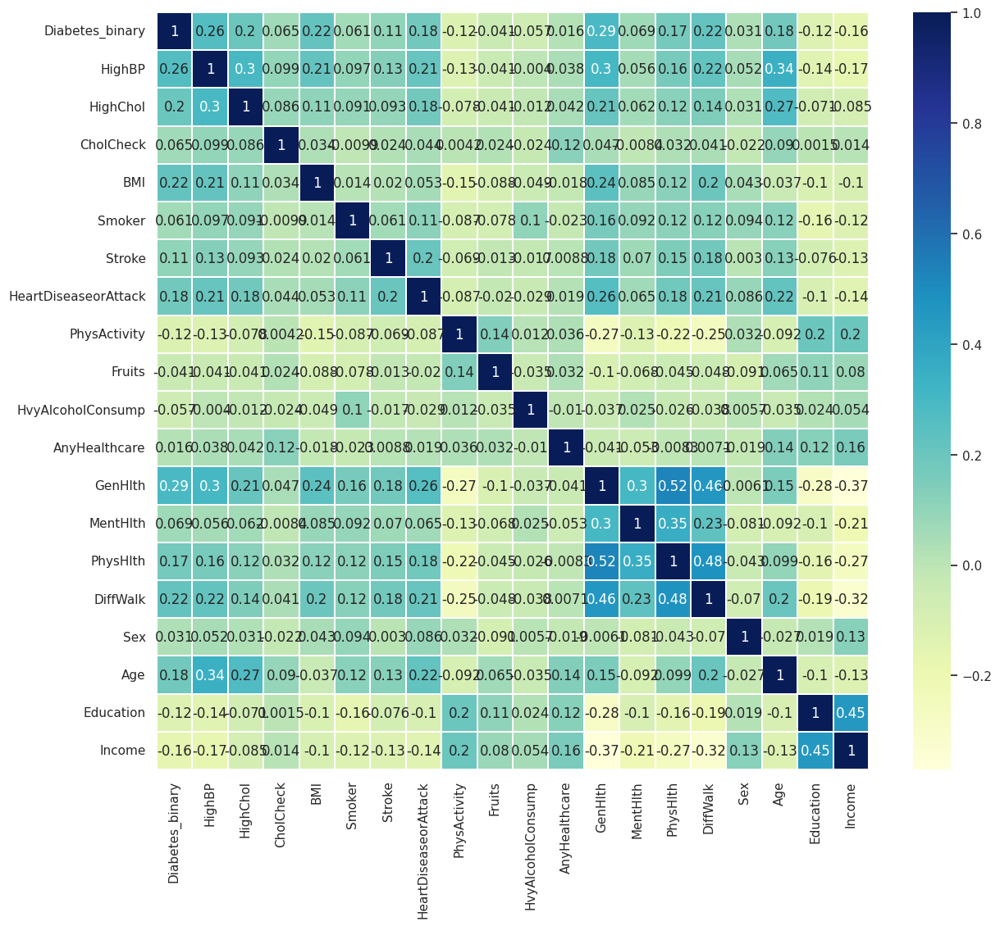

In [43]:
plt.figure(figsize=(14,12))
sns.heatmap(data2.corr(), linewidths=.1, cmap="YlGnBu", annot=True)
plt.yticks(rotation=0)

Checking each column and displaying unique values

In [44]:
# Iterate through each column and display unique values
for column in data2.columns:
    unique_values = data2[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Diabetes_binary
[ 0.  1.  2. -1. nan]

Column: HighBP
[1 0]

Column: HighChol
[1 0]

Column: CholCheck
[1 0]

Column: BMI
[40 25 28 27 24 30 34 26 33 21 23 22 38 32 37 31 29 20 35 45 39 19 47 18
 36 43 55 49 42 17 16 41 44 50 59 48 52 46 54 57 53 14 15 51 58 63 61 56
 74 62 64 66 73 85 60 67 65 70 82 79 92 68 72 88 96 13 81 71 75 12 77 69
 76 87 89 84 95 98 91 86 83 80 90 78]

Column: Smoker
[1 0]

Column: Stroke
[0 1]

Column: HeartDiseaseorAttack
[0 1]

Column: PhysActivity
[0 1]

Column: Fruits
[0 1]

Column: HvyAlcoholConsump
[0 1]

Column: AnyHealthcare
[1 0]

Column: GenHlth
[5 3 2 4 1]

Column: MentHlth
[18  0 30  3  5 15 10  6 20  2 25  1  4  7  8 21 14 26 29 16 28 11 12 24
 17 13 27 19 22  9 23]

Column: PhysHlth
[15  0 30  2 14 28  7 20  3 10  1  5 17  4 19  6 12 25 27 21 22  8 29 24
  9 16 18 23 13 26 11]

Column: DiffWalk
[1 0]

Column: Sex
[0 1]

Column: Age
[ 9.  7. 11. 10.  8. 13.  4.  6.  2. 12.  5.  1.  3. -1. -3. -6. -7. -2.
 nan]

Column: Education
[4 6 3 5 2

Checking each column value counts

In [45]:
# Iterate through each column and display value counts
for column in data2.columns:
    print(f"Column: {column}")
    print(data2[column].value_counts())
    print()

Column: Diabetes_binary
Diabetes_binary
 0.0    218327
 1.0     35346
-1.0         3
 2.0         2
Name: count, dtype: int64

Column: HighBP
HighBP
0    144851
1    108829
Name: count, dtype: int64

Column: HighChol
HighChol
0    146089
1    107591
Name: count, dtype: int64

Column: CholCheck
CholCheck
1    244210
0      9470
Name: count, dtype: int64

Column: BMI
BMI
27    24606
26    20562
24    19550
25    17146
28    16545
      ...  
85        1
91        1
86        1
90        1
78        1
Name: count, Length: 84, dtype: int64

Column: Smoker
Smoker
0    141257
1    112423
Name: count, dtype: int64

Column: Stroke
Stroke
0    243388
1     10292
Name: count, dtype: int64

Column: HeartDiseaseorAttack
HeartDiseaseorAttack
0    229787
1     23893
Name: count, dtype: int64

Column: PhysActivity
PhysActivity
1    191920
0     61760
Name: count, dtype: int64

Column: Fruits
Fruits
1    160898
0     92782
Name: count, dtype: int64

Column: HvyAlcoholConsump
HvyAlcoholConsump
0    239

## Cleaning the dataset

Checking related columns where age is less than 0 and greater than 100

In [46]:
# Check rows where 'age' is less than 0 and greater than 120 and display related columns
related_columns = ['HighBP' , 'HighChol' , 'CholCheck' , 'BMI', 'Smoker' , 'Stroke' , 'HeartDiseaseorAttack' , 'PhysActivity' ,'Fruits' ,'HvyAlcoholConsump' ,'AnyHealthcare' ,'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Education', 'Age','Diabetes_binary', 'Income']
related_data = data2[(data2['Age'] <= 0) | (data2['Age'] >= 100) ][related_columns]
print(related_data)

       HighBP  HighChol  CholCheck  BMI  Smoker  Stroke  HeartDiseaseorAttack  \
1995        0         0          1   39       0       0                     0   
3367        0         0          1   28       0       0                     0   
7958        0         0          1   32       0       0                     0   
12836       1         0          1   36       1       0                     0   
16430       0         0          1   20       0       0                     0   

       PhysActivity  Fruits  HvyAlcoholConsump  AnyHealthcare  GenHlth  \
1995              1       0                  0              1        1   
3367              1       1                  0              1        1   
7958              1       1                  0              1        2   
12836             1       0                  0              1        4   
16430             0       1                  0              0        2   

       MentHlth  PhysHlth  DiffWalk  Sex  Education  Age  Diabetes_b

Dropping the rows where age is less than 0 and greater than 100

In [47]:
# Drop rows with negative values and values greater than 100 in the 'Age' column
data2 = data2[(data2['Age'] >= 0) & (data2['Age'] <= 100)]

# Check the updated value counts in the 'age' column
print(data2['Age'].value_counts())

Age
9.0     33244
10.0    32194
8.0     30832
7.0     26313
11.0    23533
6.0     19818
13.0    17363
5.0     16156
12.0    15980
4.0     13823
3.0     11119
2.0      7597
1.0      5698
Name: count, dtype: int64


Checking related columns where diabetes is less than 0 or Nan or greater than 1

In [48]:
# Check rows where 'diabetes' is less than 0 or NaN or greater than 1and display related columns
related_columns = ['HighBP' , 'HighChol' , 'CholCheck' , 'BMI', 'Smoker' , 'Stroke' , 'HeartDiseaseorAttack' , 'PhysActivity' ,'Fruits' ,'HvyAlcoholConsump' ,'AnyHealthcare' ,'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Education', 'Age','Diabetes_binary', 'Income']
related_data = data2[(data2['Diabetes_binary'] < 0) | (data2['Diabetes_binary'] > 1) | data2['Diabetes_binary'].isna()][related_columns]
print(related_data)

Empty DataFrame
Columns: [HighBP, HighChol, CholCheck, BMI, Smoker, Stroke, HeartDiseaseorAttack, PhysActivity, Fruits, HvyAlcoholConsump, AnyHealthcare, GenHlth, MentHlth, PhysHlth, DiffWalk, Sex, Education, Age, Diabetes_binary, Income]
Index: []


In [49]:
data2.isnull().sum()

Diabetes_binary         0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
HvyAlcoholConsump       0
AnyHealthcare           0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

## Numerical Column Distribution Visualization

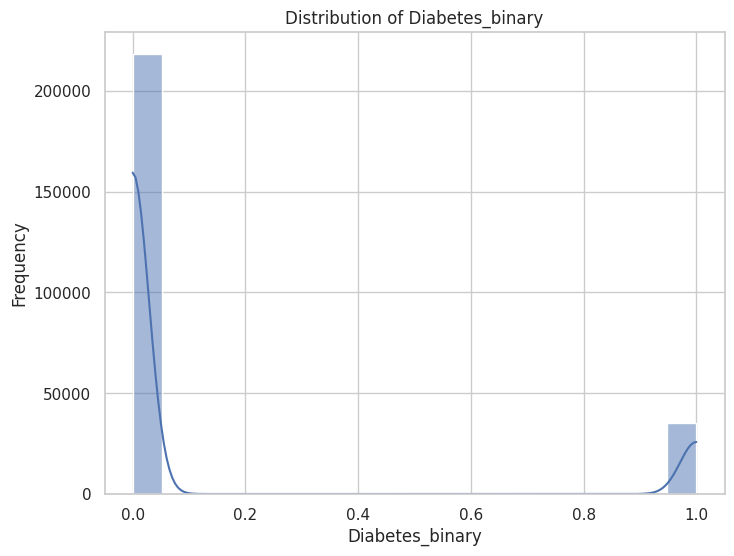

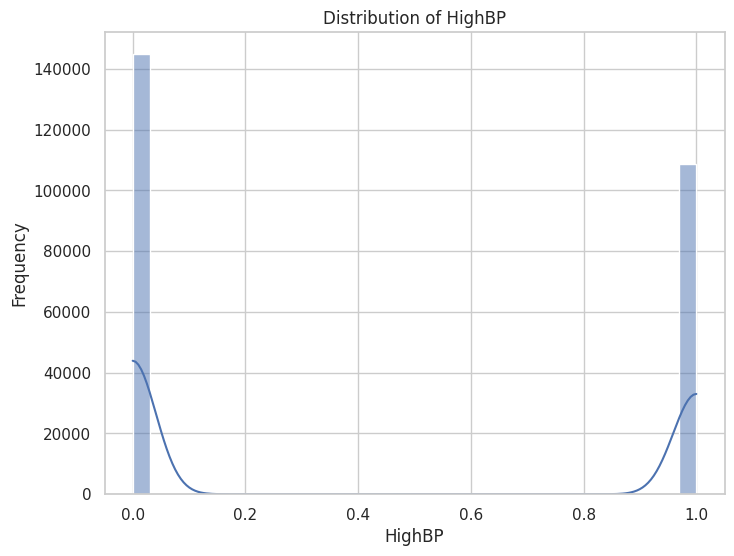

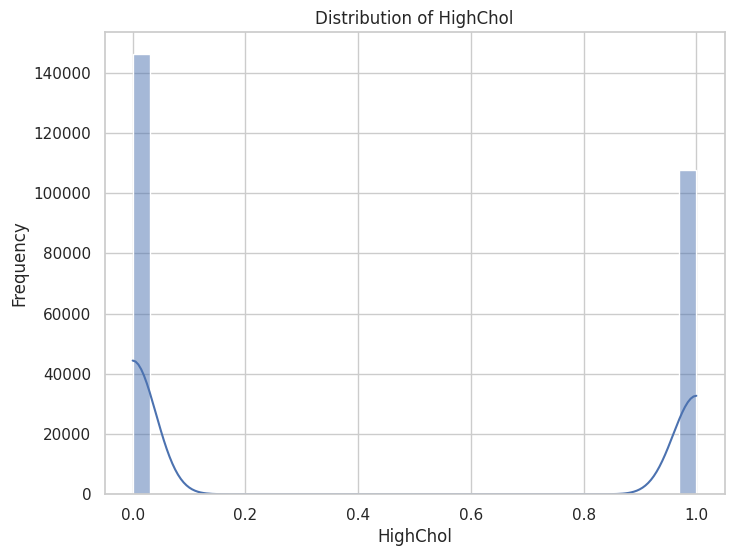

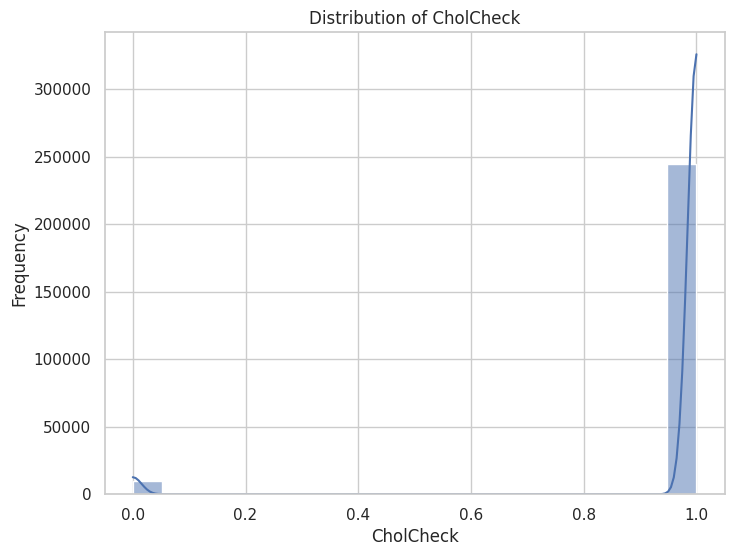

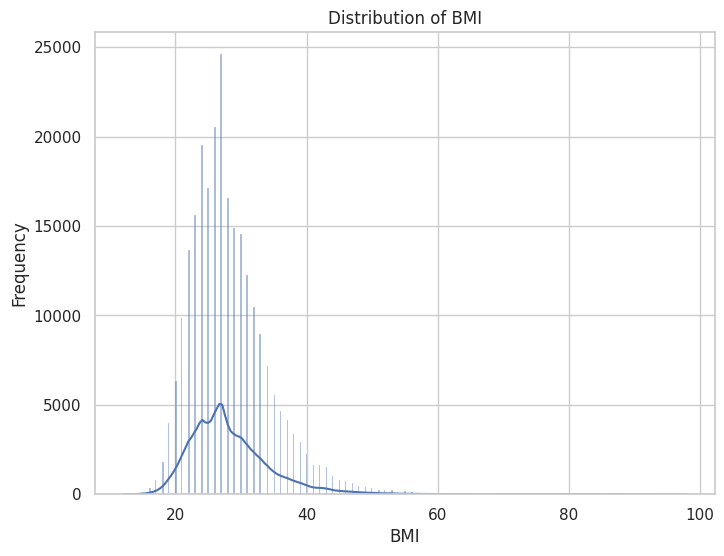

...

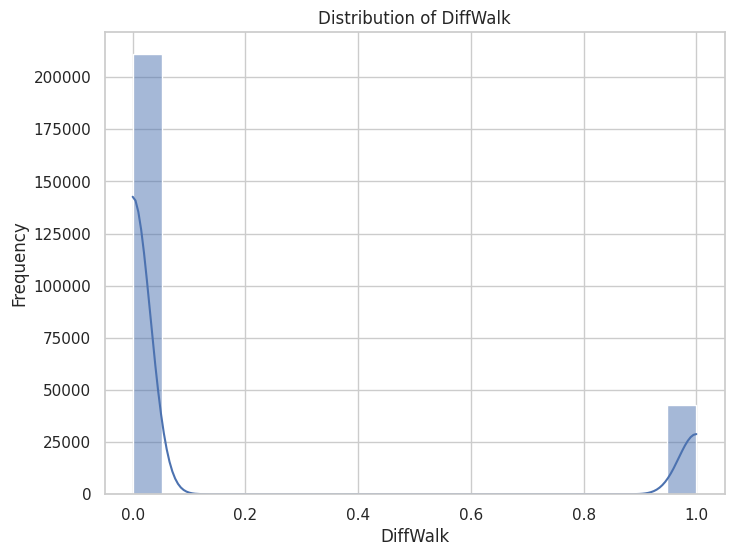

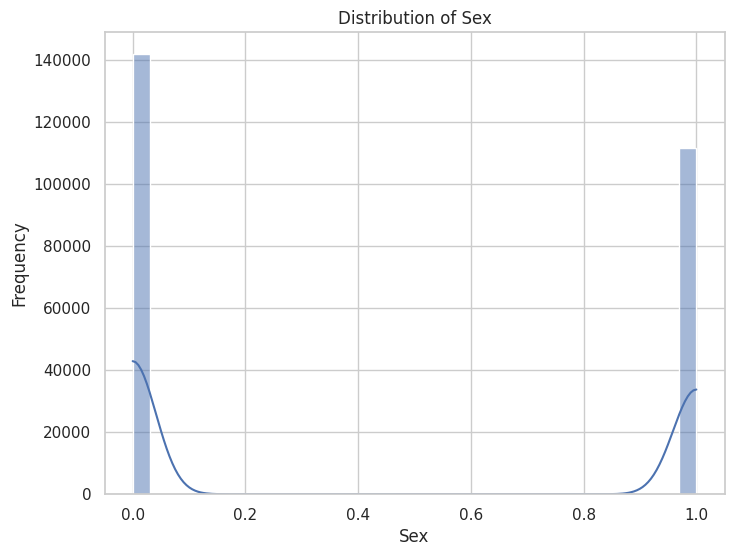

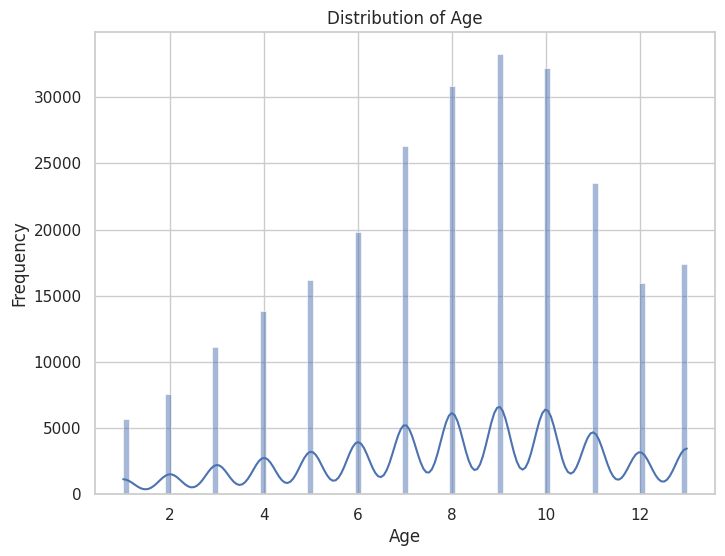

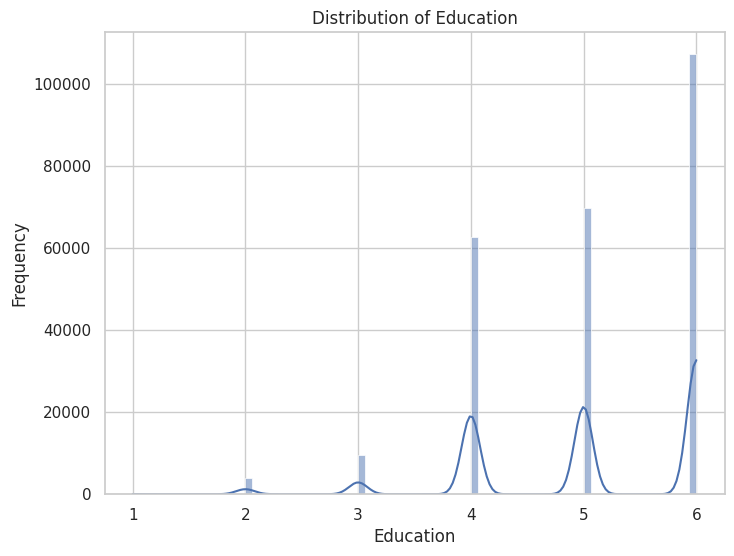

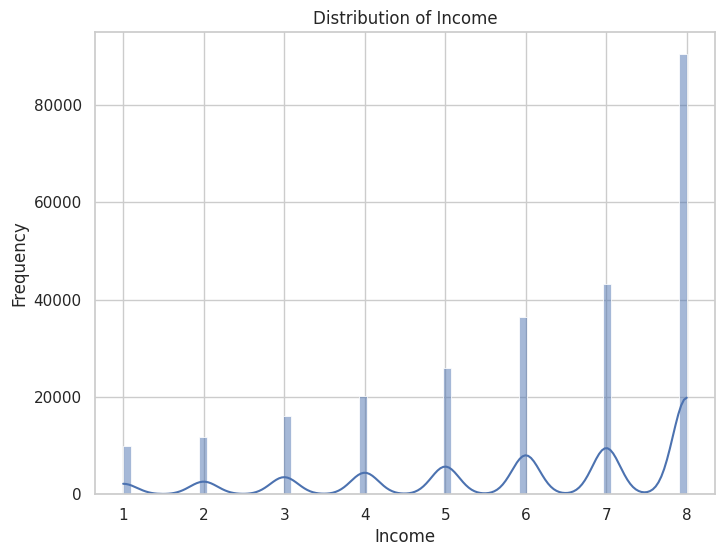

In [50]:
# Visualize the distribution of each numerical column
sns.set(style="whitegrid")

# Plot histograms of numerical columns
numerical_cols = data2.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data2[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

## Outlier Detection with box plots and Removal

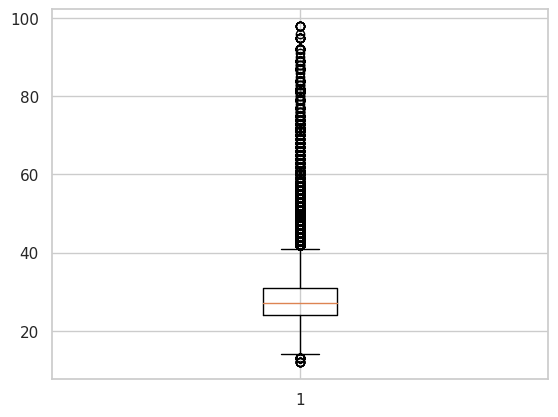

In [51]:
plt.boxplot(data2['BMI'])
plt.show()

In [52]:
mean = data2['BMI'].mean()
std  = data2['BMI'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data2 = data2[(data2['BMI'] >= lower_bound)
                & (data2['BMI'] <= upper_bound)]

Lower Bound : 15.164997861981059
Upper Bound : 41.599759499945854


# Dataset 3

Reading Dataset

In [53]:
data3 = pd.read_csv("diabetes_binary_5050split_health_indicators_BRFSS2015.csv")
data3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       70688 non-null  float64
 1   HighBP                70692 non-null  int64  
 2   HighChol              70692 non-null  int64  
 3   CholCheck             70692 non-null  int64  
 4   BMI                   70692 non-null  int64  
 5   Smoker                70692 non-null  int64  
 6   HeartDiseaseorAttack  70692 non-null  int64  
 7   PhysActivity          70692 non-null  int64  
 8   Veggies               70692 non-null  int64  
 9   HvyAlcoholConsump     70692 non-null  int64  
 10  AnyHealthcare         70692 non-null  int64  
 11  NoDocbcCost           70692 non-null  int64  
 12  GenHlth               70692 non-null  int64  
 13  MentHlth              70692 non-null  int64  
 14  PhysHlth              70692 non-null  int64  
 15  DiffWalk           

In [54]:
data3.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1,0,1,26,0,0,1,1,0,1,0,3,5,30,0,1,4.0,6,8
1,0.0,1,1,1,26,1,0,0,0,0,1,0,3,0,0,0,1,12.0,6,8
2,0.0,0,0,1,26,0,0,1,1,0,1,0,1,0,10,0,1,13.0,6,8
3,0.0,1,1,1,28,1,0,1,1,0,1,0,3,0,3,0,1,11.0,6,8
4,0.0,0,0,1,29,1,0,1,1,0,1,0,2,0,0,0,0,8.0,5,8


In [55]:
data3.describe()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,HeartDiseaseorAttack,PhysActivity,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,70688.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70690.000000,70692.000000,70692.000000
mean,0.499973,0.563458,0.525703,0.975259,29.856985,0.475273,0.147810,0.703036,0.788774,0.042721,0.954960,0.093914,2.837082,3.752037,5.810417,0.252730,0.456997,8.597652,4.920953,5.698311
std,0.500087,0.495960,0.499342,0.155336,7.113954,0.499392,0.354914,0.456924,0.408181,0.202228,0.207394,0.291712,1.113565,8.155627,10.062261,0.434581,0.498151,4.269213,1.029081,2.175196
min,-1.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-12.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,25.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,7.000000,4.000000,4.000000
50%,0.050000,1.000000,1.000000,1.000000,29.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,9.000000,5.000000,6.000000
75%,1.000000,1.000000,1.000000,1.000000,33.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,4.000000,2.000000,6.000000,1.000000,1.000000,11.000000,6.000000,8.000000
max,2.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,800.000000,6.000000,8.000000


Checking each column and displaying unique values

In [56]:
# Iterate through each column and display unique values
for column in data3.columns:
    unique_values = data3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Diabetes_binary
[ 0.   0.1 -1.   nan  1.   2. ]

Column: HighBP
[1 0]

Column: HighChol
[0 1]

Column: CholCheck
[1 0]

Column: BMI
[26 28 29 18 31 32 27 24 21 58 30 20 22 38 40 25 36 47 19 37 41 23 34 35
 42 17 33 44 15 52 69 56 45 39 92 53 98 50 46 79 48 16 63 72 54 49 68 43
 84 73 76 55 51 75 57 60 12 77 82 67 71 61 14 81 59 86 13 87 65 95 89 62
 64 66 85 70 83 80 78 74]

Column: Smoker
[0 1]

Column: HeartDiseaseorAttack
[0 1]

Column: PhysActivity
[1 0]

Column: Veggies
[1 0]

Column: HvyAlcoholConsump
[0 1]

Column: AnyHealthcare
[1 0]

Column: NoDocbcCost
[0 1]

Column: GenHlth
[3 1 2 4 5]

Column: MentHlth
[ 5  0  7  3  4  2 30 20  1 15 10 25 14 28  6 29 26 12 16 22 13  8  9 21
 18 17 27 24 23 11 19]

Column: PhysHlth
[30  0 10  3  6  4 15  1  2 14  7 25 21 20  5  8 22 23 29 12 18 28 26 24
 27 11 13 16 17  9 19]

Column: DiffWalk
[0 1]

Column: Sex
[1 0]

Column: Age
[  4.  12.  13.  11.   8.   1.   6.   3.   7.  10.   9.   5.   2. 300.
 -12. 800. -11.  nan -10.  -5.]



Checking each column value counts

In [57]:
# Iterate through each column and display value counts
for column in data3.columns:
    print(f"Column: {column}")
    print(data3[column].value_counts())
    print()

Column: Diabetes_binary
Diabetes_binary
 0.0    35342
 1.0    35342
-1.0        2
 0.1        1
 2.0        1
Name: count, dtype: int64

Column: HighBP
HighBP
1    39832
0    30860
Name: count, dtype: int64

Column: HighChol
HighChol
1    37163
0    33529
Name: count, dtype: int64

Column: CholCheck
CholCheck
1    68943
0     1749
Name: count, dtype: int64

Column: BMI
BMI
27    6327
26    4975
28    4583
24    4392
30    4344
      ... 
85       1
83       1
80       1
78       1
74       1
Name: count, Length: 80, dtype: int64

Column: Smoker
Smoker
0    37094
1    33598
Name: count, dtype: int64

Column: HeartDiseaseorAttack
HeartDiseaseorAttack
0    60243
1    10449
Name: count, dtype: int64

Column: PhysActivity
PhysActivity
1    49699
0    20993
Name: count, dtype: int64

Column: Veggies
Veggies
1    55760
0    14932
Name: count, dtype: int64

Column: HvyAlcoholConsump
HvyAlcoholConsump
0    67672
1     3020
Name: count, dtype: int64

Column: AnyHealthcare
AnyHealthcare
1    6750

## Cleaning the dataset

Checking related columns where age is less than 0 and greater than 100

In [58]:
# Check rows where 'age' is less than 0 and greater than 120 and display related columns
related_columns = ['HighBP' , 'HighChol' , 'CholCheck' , 'BMI', 'Smoker' , 'NoDocbcCost' , 'HeartDiseaseorAttack' , 'PhysActivity' ,'Veggies' ,'HvyAlcoholConsump' ,'AnyHealthcare' ,'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Education', 'Age','Diabetes_binary', 'Income']
related_data = data3[(data3['Age'] <= 0) | (data3['Age'] >= 100) ][related_columns]
print(related_data)

       HighBP  HighChol  CholCheck  BMI  Smoker  NoDocbcCost  \
495         0         0          1   23       0            0   
1270        1         1          1   25       1            1   
1704        1         0          1   36       0            0   
3935        1         0          1   34       1            0   
5295        0         0          1   26       0            0   
50339       1         1          1   26       0            0   
54271       0         0          1   24       0            0   
57640       1         1          1   31       1            0   

       HeartDiseaseorAttack  PhysActivity  Veggies  HvyAlcoholConsump  \
495                       0             1        1                  0   
1270                      0             1        1                  0   
1704                      0             1        1                  0   
3935                      0             1        1                  0   
5295                      0             0        0        

Dropping the rows where age is less than 0 and greater than 100

In [59]:
# Drop rows with negative values and values greater than 100 in the 'Age' column
data3 = data3[(data3['Age'] >= 0) & (data3['Age'] <= 100)]

# Check the updated value counts in the 'age' column
print(data3['Age'].value_counts())

Age
10.0    10855
9.0     10111
8.0      8602
11.0     8043
7.0      6872
13.0     5426
12.0     5390
6.0      4648
5.0      3519
4.0      2793
3.0      2048
2.0      1396
1.0       979
Name: count, dtype: int64


In [60]:
# Iterate through each column and display unique values
for column in data3.columns:
    unique_values = data3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Diabetes_binary
[0. 1.]

Column: HighBP
[1 0]

Column: HighChol
[0 1]

Column: CholCheck
[1 0]

Column: BMI
[26 28 29 18 31 32 27 24 21 58 30 20 22 38 40 25 36 47 19 37 41 23 34 35
 42 17 33 44 15 52 69 56 45 39 92 53 98 50 46 79 48 16 63 72 54 49 68 43
 84 73 76 55 51 75 57 60 12 77 82 67 71 61 14 81 59 86 13 87 65 95 89 62
 64 66 85 70 83 80 78 74]

Column: Smoker
[0 1]

Column: HeartDiseaseorAttack
[0 1]

Column: PhysActivity
[1 0]

Column: Veggies
[1 0]

Column: HvyAlcoholConsump
[0 1]

Column: AnyHealthcare
[1 0]

Column: NoDocbcCost
[0 1]

Column: GenHlth
[3 1 2 4 5]

Column: MentHlth
[ 5  0  7  3  4  2 30 20  1 15 10 25 14 28  6 29 26 12 16 22 13  8  9 21
 18 17 27 24 23 11 19]

Column: PhysHlth
[30  0 10  3  6  4 15  1  2 14  7 25 21 20  5  8 22 23 29 12 18 28 26 24
 27 11 13 16 17  9 19]

Column: DiffWalk
[0 1]

Column: Sex
[1 0]

Column: Age
[ 4. 12. 13. 11.  8.  1.  6.  3.  7. 10.  9.  5.  2.]

Column: Education
[6 5 4 3 2 1]

Column: Income
[8 7 6 3 4 1 5 2]



## Numerical Column Distribution Visualization

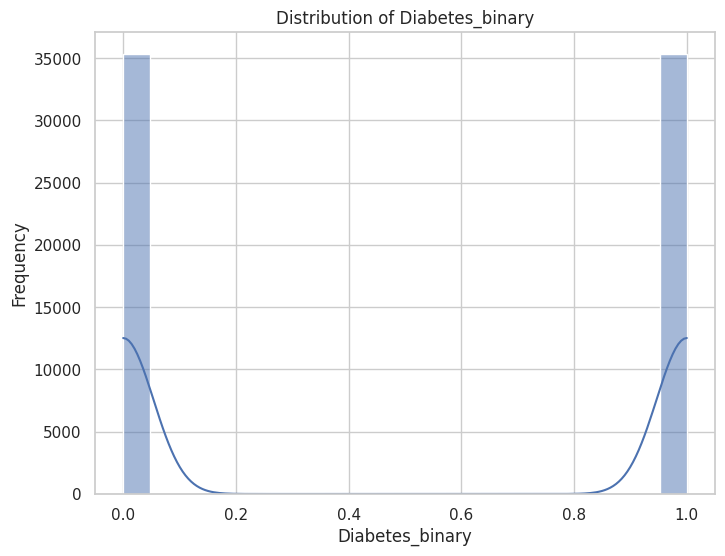

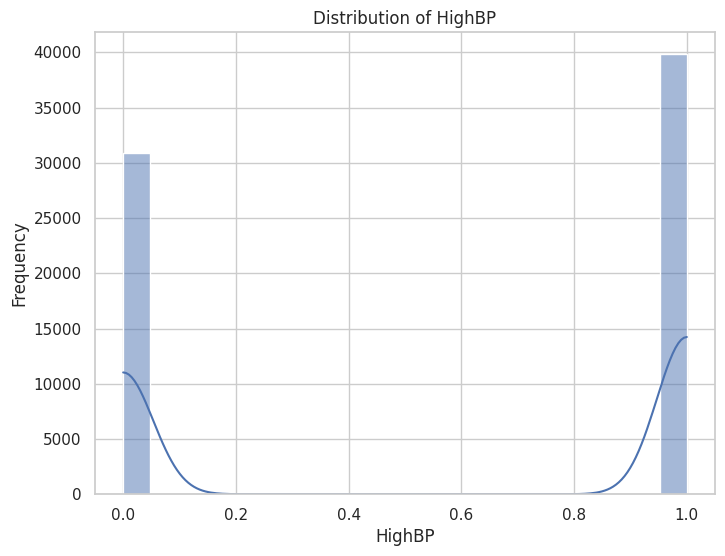

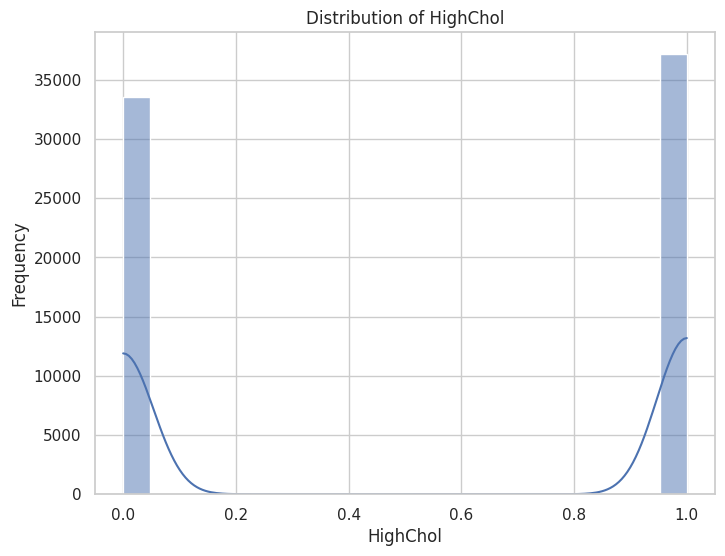

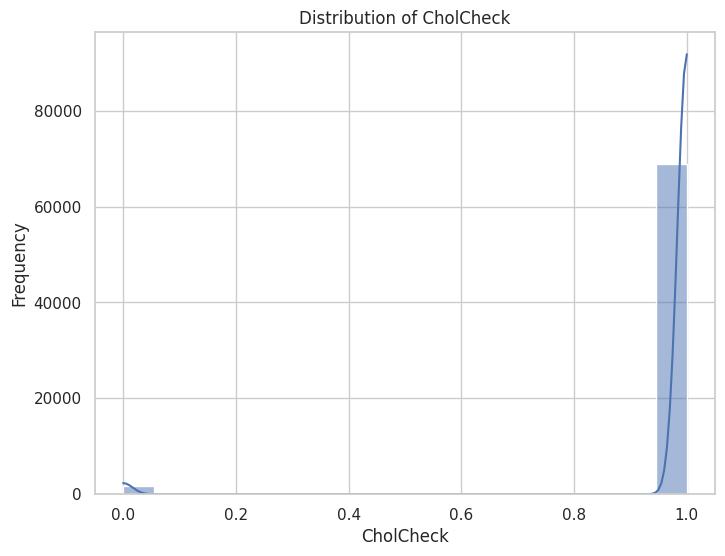

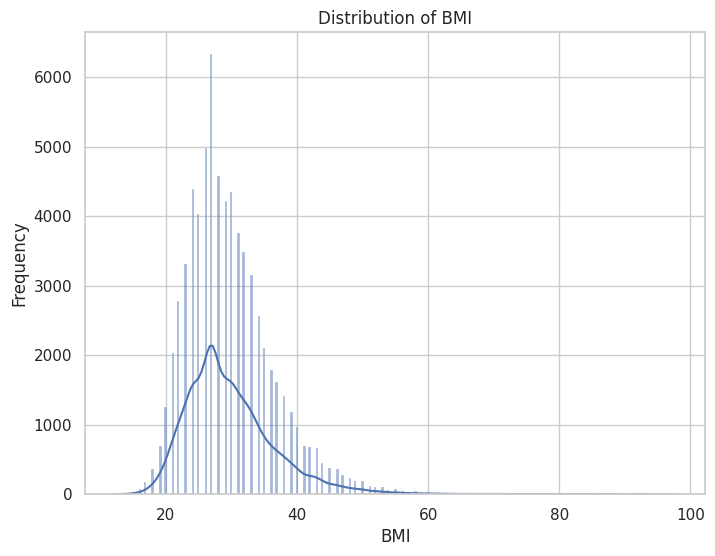

...

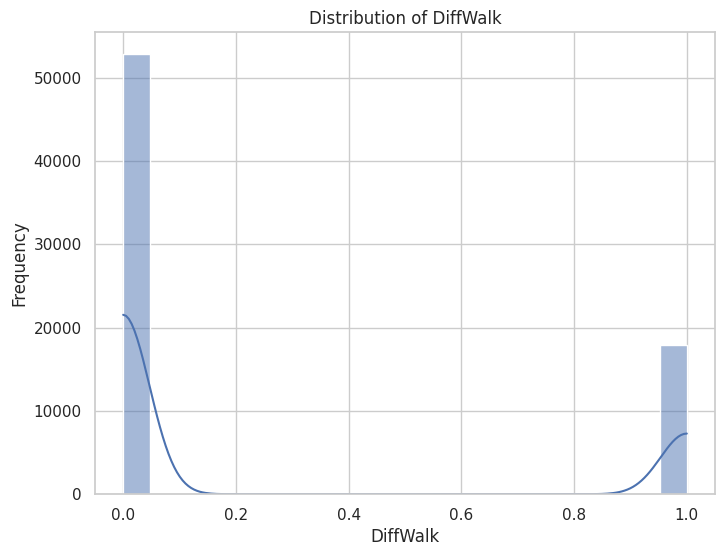

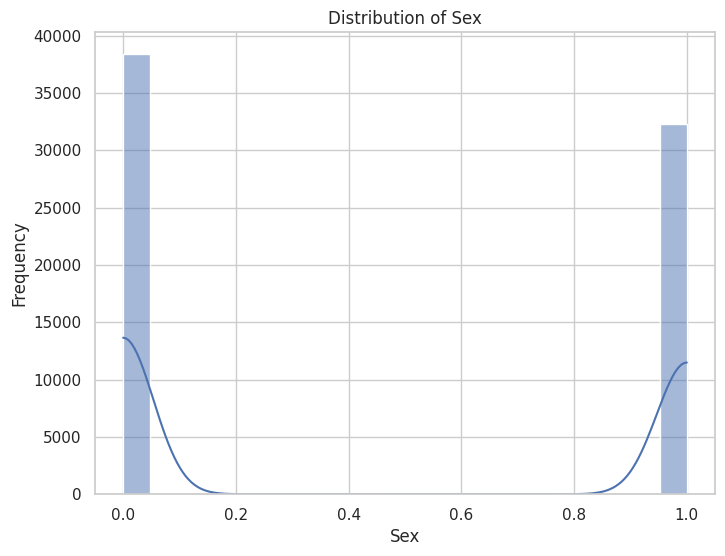

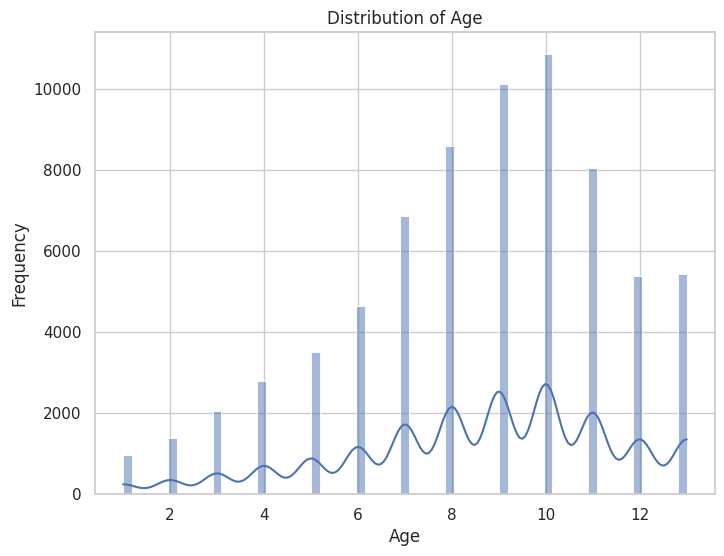

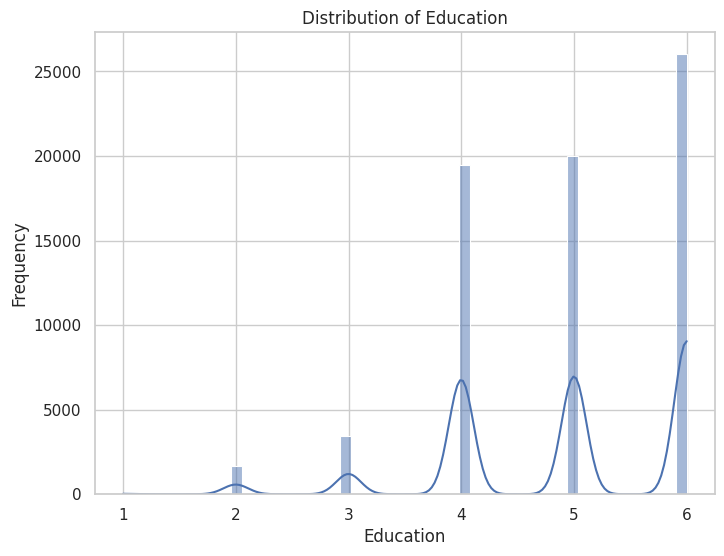

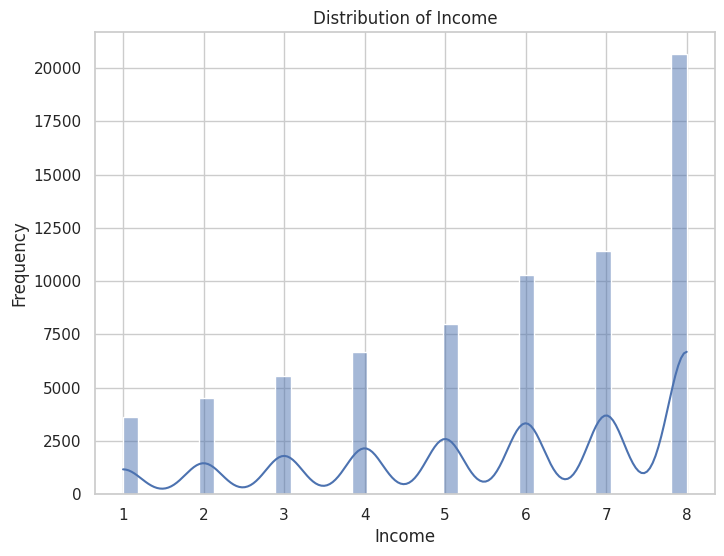

In [61]:
# Visualize the distribution of each numerical column
sns.set(style="whitegrid")

# Plot histograms of numerical columns
numerical_cols = data3.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data3[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [62]:
data3.isnull().sum()

Diabetes_binary         0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
HeartDiseaseorAttack    0
PhysActivity            0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

Correlation Matrix

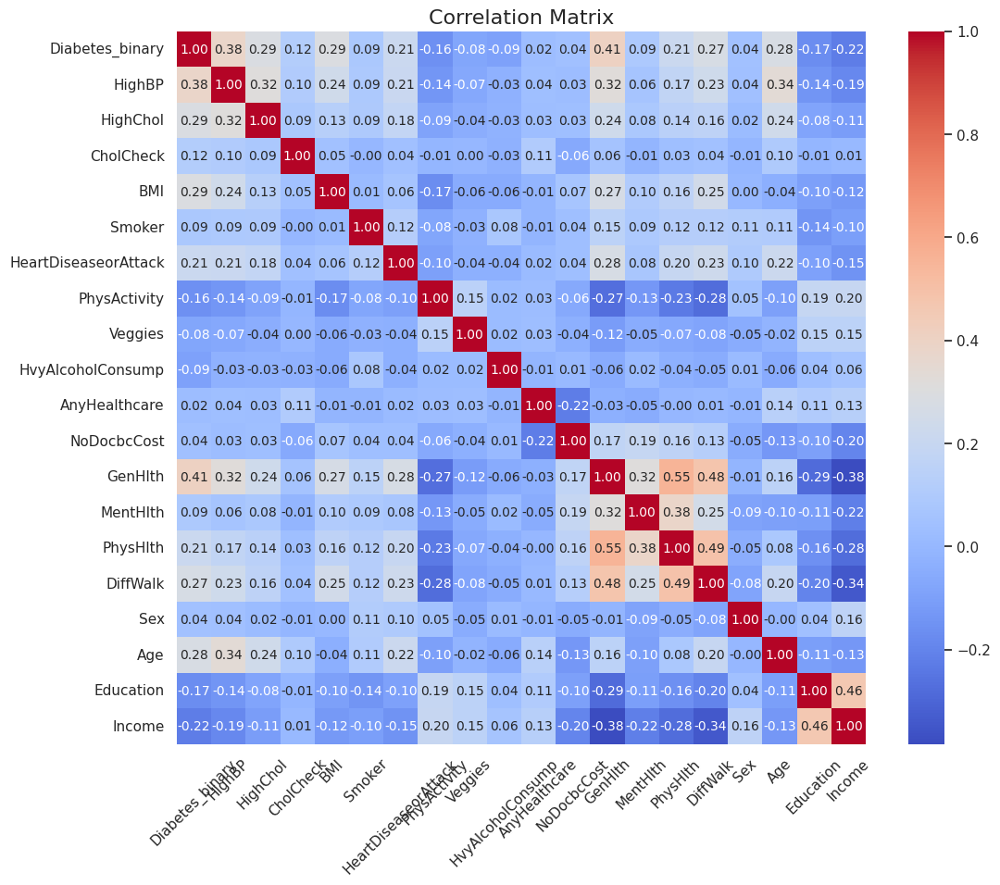

Diabetes_binary         1.000000
GenHlth                 0.407651
HighBP                  0.381537
BMI                     0.293390
HighChol                0.289197
Age                     0.278806
DiffWalk                0.272665
Income                  0.224419
PhysHlth                0.213047
HeartDiseaseorAttack    0.211546
Education               0.170457
PhysActivity            0.158668
CholCheck               0.115394
HvyAlcoholConsump       0.094866
MentHlth                0.087082
Smoker                  0.086041
Veggies                 0.079290
Sex                     0.044422
NoDocbcCost             0.041022
AnyHealthcare           0.023270
Name: Diabetes_binary, dtype: float64


In [63]:
# Calculate correlation matrix
corr_matrix = data3.corr()

# Visualize correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10})
plt.title("Correlation Matrix", fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

# Identify columns with high correlation to the target column
target_corr = corr_matrix['Diabetes_binary'].abs().sort_values(ascending=False)
print(target_corr)

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5]),
 [Text(0, 0.5, 'Diabetes_binary'),
  Text(0, 1.5, 'HighBP'),
  Text(0, 2.5, 'HighChol'),
  Text(0, 3.5, 'CholCheck'),
  Text(0, 4.5, 'BMI'),
  Text(0, 5.5, 'Smoker'),
  Text(0, 6.5, 'HeartDiseaseorAttack'),
  Text(0, 7.5, 'PhysActivity'),
  Text(0, 8.5, 'Veggies'),
  Text(0, 9.5, 'HvyAlcoholConsump'),
  Text(0, 10.5, 'AnyHealthcare'),
  Text(0, 11.5, 'NoDocbcCost'),
  Text(0, 12.5, 'GenHlth'),
  Text(0, 13.5, 'MentHlth'),
  Text(0, 14.5, 'PhysHlth'),
  Text(0, 15.5, 'DiffWalk'),
  Text(0, 16.5, 'Sex'),
  Text(0, 17.5, 'Age'),
  Text(0, 18.5, 'Education'),
  Text(0, 19.5, 'Income')])

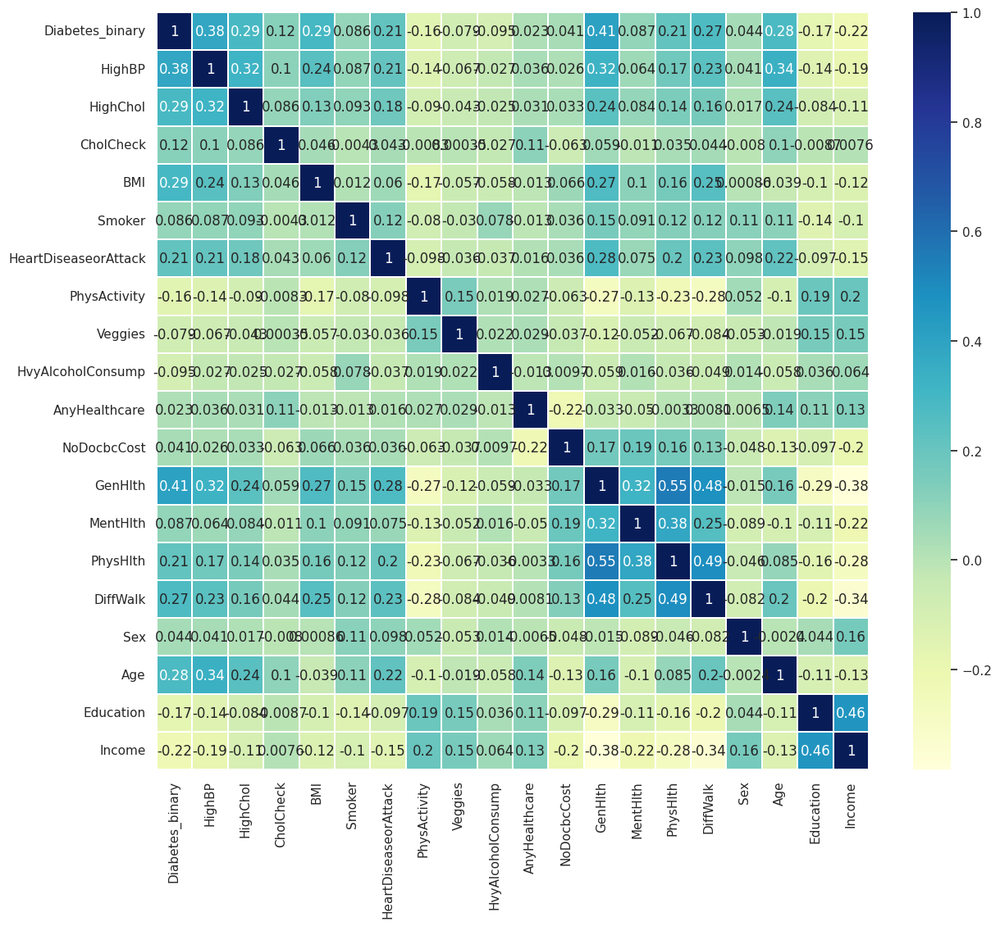

In [64]:
plt.figure(figsize=(14,12))
sns.heatmap(data3.corr(), linewidths=.1, cmap="YlGnBu", annot=True)
plt.yticks(rotation=0)

## Outlier Detection and Removal

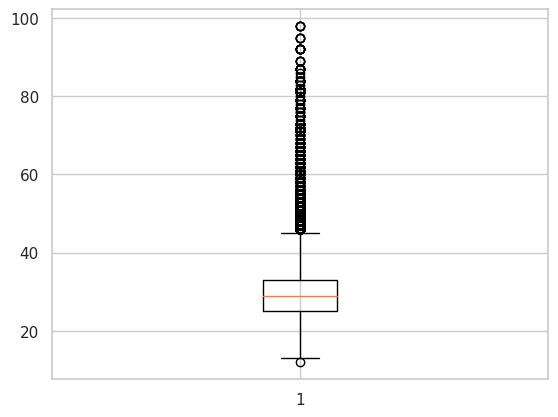

In [65]:
plt.boxplot(data3['BMI'])
plt.show()

In [66]:
mean = data3['BMI'].mean()
std  = data3['BMI'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data3 = data3[(data3['BMI'] >= lower_bound)
                & (data3['BMI'] <= upper_bound)]

Lower Bound : 15.628773302367975
Upper Bound : 44.08563772165511


# Merging Dataset 2 and 3

In [68]:
data_2_3 = pd.merge(data2, data3, on=['HighBP' , 'HighChol' , 'CholCheck' , 'BMI', 'Smoker' , 'HeartDiseaseorAttack' , 'PhysActivity' , 'HvyAlcoholConsump' ,'AnyHealthcare' ,'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Education', 'Age','Diabetes_binary', 'Income'])

data_2_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123435 entries, 0 to 123434
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_binary       123435 non-null  float64
 1   HighBP                123435 non-null  int64  
 2   HighChol              123435 non-null  int64  
 3   CholCheck             123435 non-null  int64  
 4   BMI                   123435 non-null  int64  
 5   Smoker                123435 non-null  int64  
 6   Stroke                123435 non-null  int64  
 7   HeartDiseaseorAttack  123435 non-null  int64  
 8   PhysActivity          123435 non-null  int64  
 9   Fruits                123435 non-null  int64  
 10  HvyAlcoholConsump     123435 non-null  int64  
 11  AnyHealthcare         123435 non-null  int64  
 12  GenHlth               123435 non-null  int64  
 13  MentHlth              123435 non-null  int64  
 14  PhysHlth              123435 non-null  int64  
 15  

# Cleaning the Merged Dataset (Dataset 2 and Dataset 3)

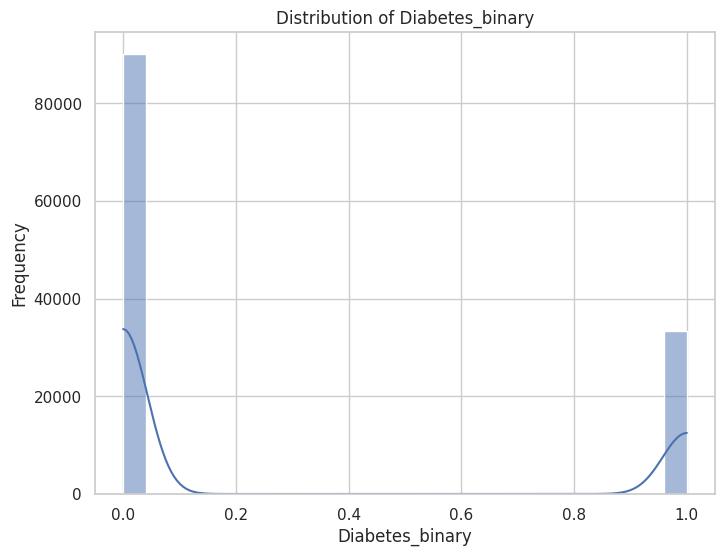

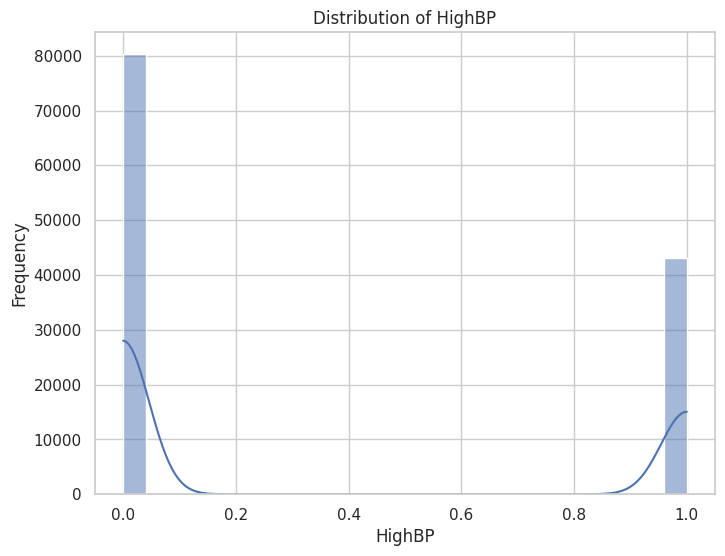

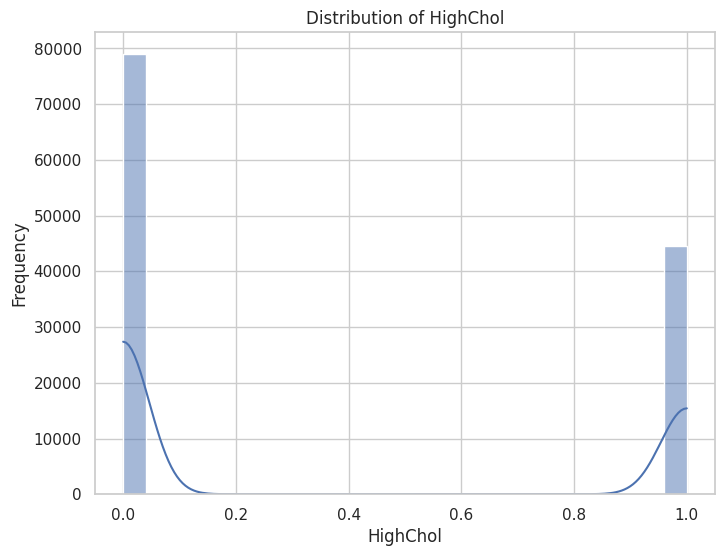

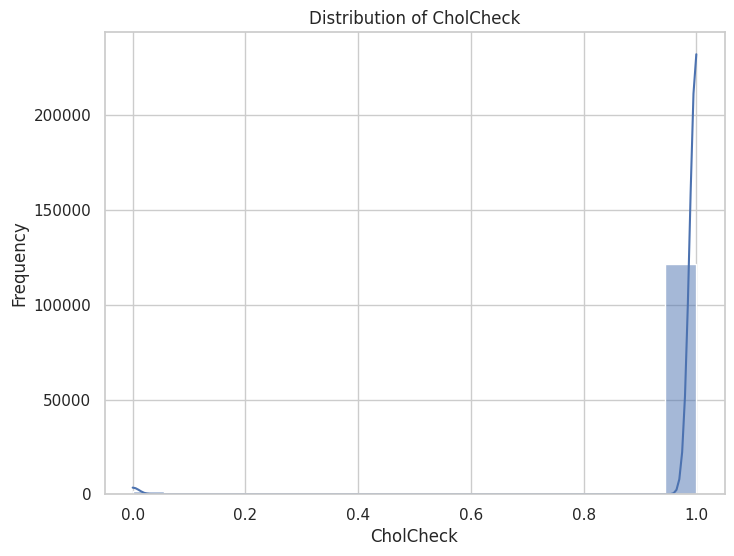

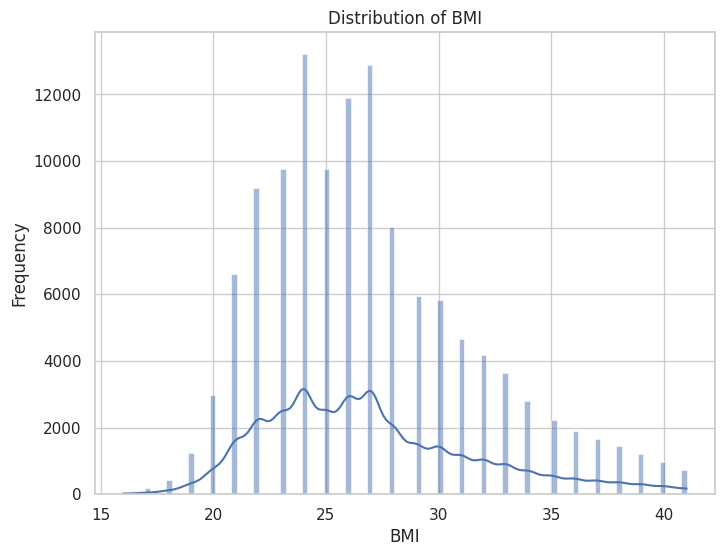

...

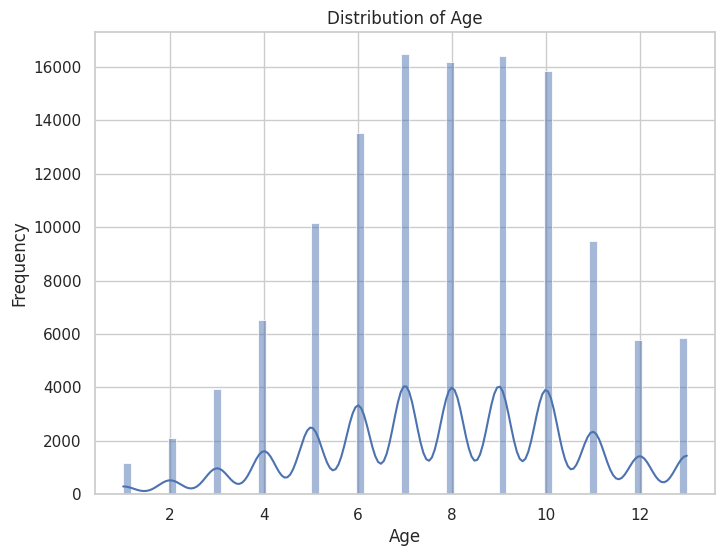

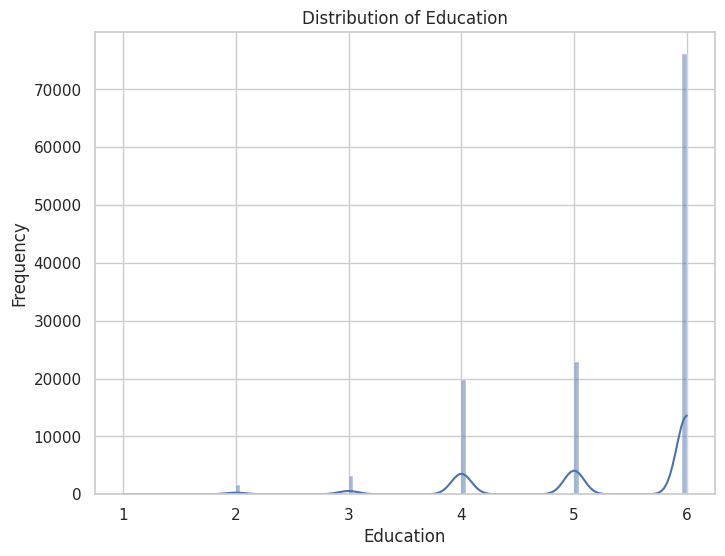

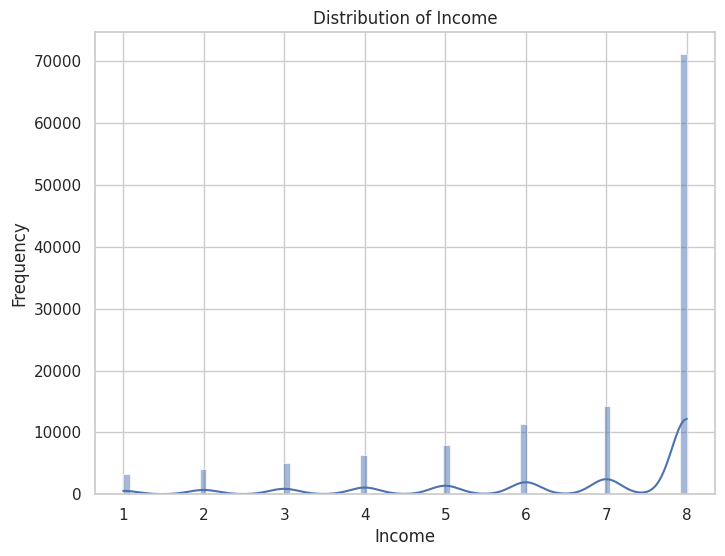

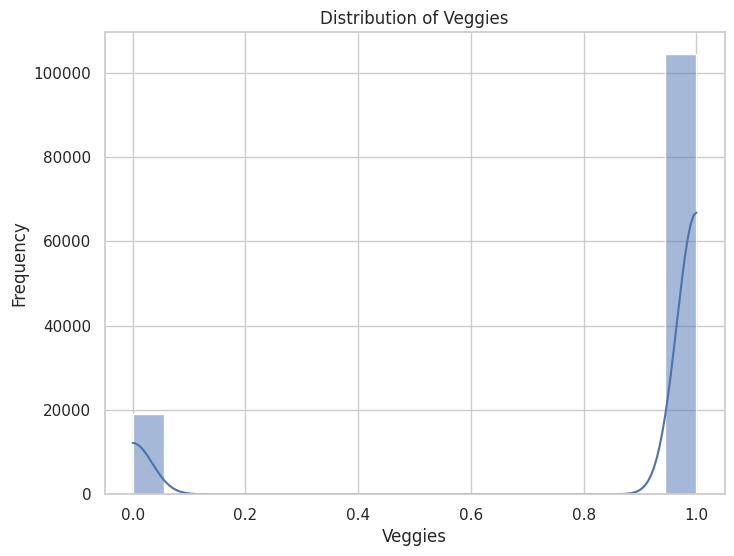

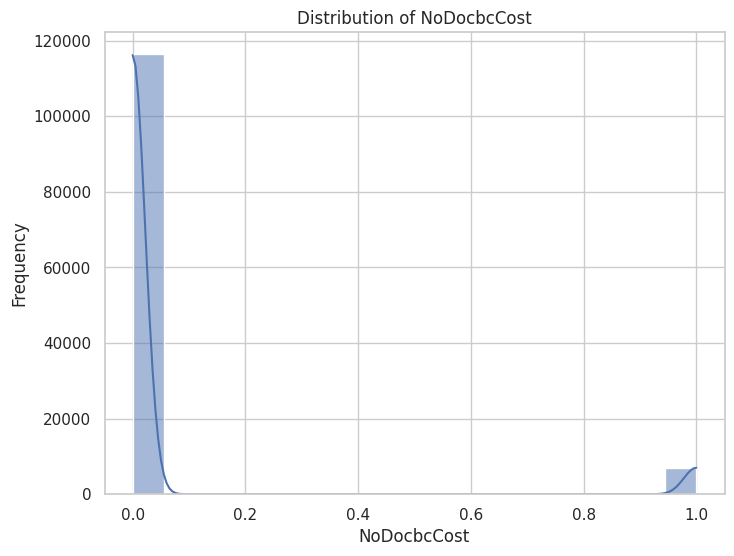

In [69]:
# Plot histograms of numerical columns
numerical_cols = data_2_3.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data_2_3[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

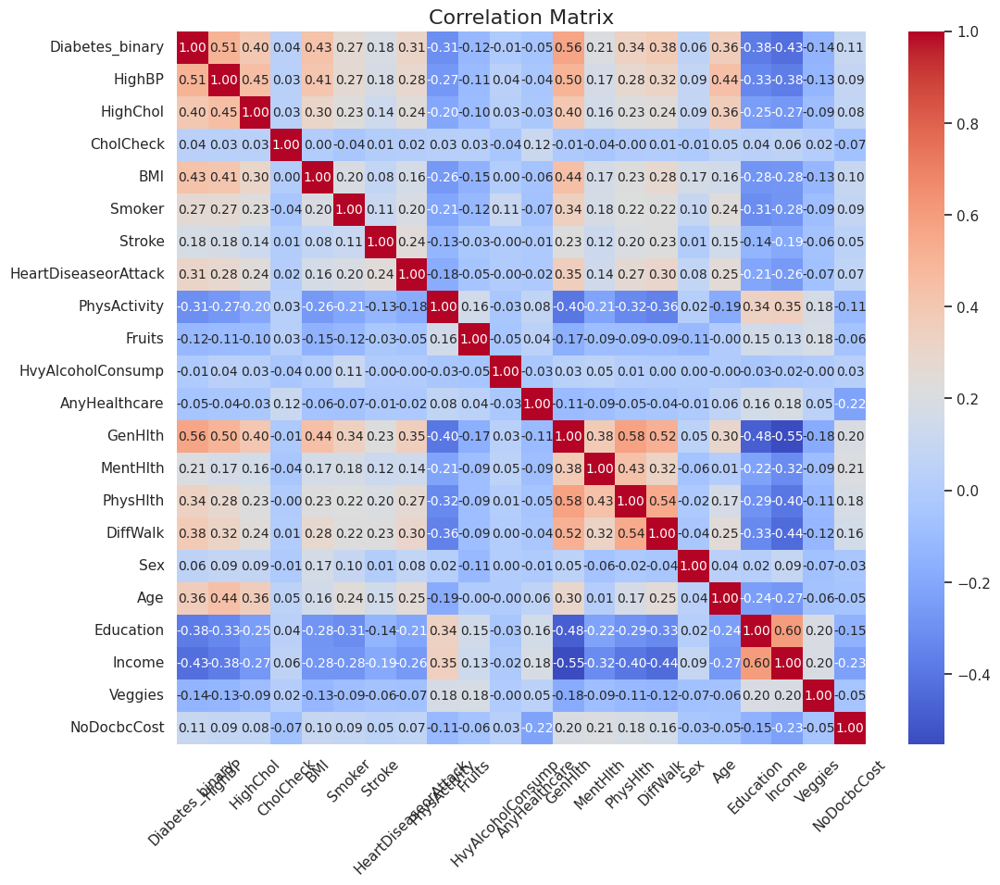

Diabetes_binary         1.000000
GenHlth                 0.564103
HighBP                  0.508495
Income                  0.430609
BMI                     0.429720
HighChol                0.397344
DiffWalk                0.378675
Education               0.378089
Age                     0.362058
PhysHlth                0.338217
PhysActivity            0.308978
HeartDiseaseorAttack    0.308874
Smoker                  0.266997
MentHlth                0.208592
Stroke                  0.183604
Veggies                 0.140893
Fruits                  0.117316
NoDocbcCost             0.107643
Sex                     0.056336
AnyHealthcare           0.052512
CholCheck               0.042009
HvyAlcoholConsump       0.009142
Name: Diabetes_binary, dtype: float64


In [70]:
# Calculate correlation matrix
corr_matrix = data_2_3.corr()

# Visualize correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10})
plt.title("Correlation Matrix", fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

# Identify columns with high correlation to the target column
target_corr = corr_matrix['Diabetes_binary'].abs().sort_values(ascending=False)
print(target_corr)

# Modifying Dataset 1 and Previously Merged Dataset to Merge into Final Dataset

In [71]:
# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: age
[80 54 28 36 76 20 44 79 42 32 53 78 67 15 37 40  5 69 72 30 45 43 50 41
 26 77 66 29 60 38  3 57 74 19 46 21 59 27 13 56  2  7 11 34  6 55  9 62
 47 12 68 75 22 58 18 24 17 25 16 33 31  8 49 39 65 14 70 48 51 71  4 64
 63 52 10 35 61 73 23  1]

Column: hypertension
[0 1]

Column: heart_disease
[1 0]

Column: bmi
[25.19 27.32 23.45 ... 38.12 34.81 39.96]

Column: HbA1c_level
[6.6 5.7 5.  4.8 6.5 6.1 5.8 3.5 6.  6.2 4.  4.5 7.  7.5 6.8]

Column: blood_glucose_level
[140  80 158 155  85 200 145 100 130 160 126 159  90]

Column: diabetes
[0. 1.]

Column: gender_Male
[0 1]

Column: smoking_history_current
[0 1]

Column: smoking_history_ever
[0 1]

Column: smoking_history_former
[0 1]

Column: smoking_history_never
[1 0]

Column: smoking_history_not current
[0 1]



In [72]:
# Iterate through each column and display unique values
for column in data_2_3.columns:
    unique_values = data_2_3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: Diabetes_binary
[0. 1.]

Column: HighBP
[1 0]

Column: HighChol
[1 0]

Column: CholCheck
[1 0]

Column: BMI
[40 25 30 26 28 23 38 27 32 37 34 31 24 33 29 21 35 22 16 41 36 20 39 18
 19 17]

Column: Smoker
[1 0]

Column: Stroke
[0 1]

Column: HeartDiseaseorAttack
[0 1]

Column: PhysActivity
[0 1]

Column: Fruits
[0 1]

Column: HvyAlcoholConsump
[0 1]

Column: AnyHealthcare
[1 0]

Column: GenHlth
[5 3 4 2 1]

Column: MentHlth
[18  0 30 15 20  2  4  5  1  3 14  7 10 29 25 21  6 12 24 17 13 28  8 27
 19 23  9 16 11 22 26]

Column: PhysHlth
[15  0 30 20  7  1  5 10  2  3 19 14  6 12 28 27 22 25 21  4  8 13 18 23
 29 17  9 16 11 26 24]

Column: DiffWalk
[1 0]

Column: Sex
[0 1]

Column: Age
[ 9.  7. 13. 11.  5. 10. 12.  8.  6.  4.  3.  2.  1.]

Column: Education
[4 6 5 2 3 1]

Column: Income
[3 1 8 7 6 4 5 2]

Column: Veggies
[1 0]

Column: NoDocbcCost
[0 1]



From the dataset actual source (Kaggle) we have got to know that Age values corresponding actual values. Source (https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset/data?select=diabetes_binary_health_indicators_BRFSS2015.csv)

<table>
<tr><td>Value</td><td>Age Between</td></tr>
<tr><td>1</td><td>18-24</td></tr>
<tr><td>2</td><td>25-29</td></tr>
<tr><td>3</td><td>30-34</td></tr>
<tr><td>4</td><td>35-39</td></tr>
<tr><td>5</td><td>40-44</td></tr>
<tr><td>6</td><td>45-49</td></tr>
<tr><td>7</td><td>50-54</td></tr>
<tr><td>8</td><td>55-59</td></tr>
<tr><td>9</td><td>60-64</td></tr>
<tr><td>10</td><td>65-69</td></tr>
<tr><td>11</td><td>70-74</td></tr>
<tr><td>12</td><td>75-79</td></tr>
<tr><td>13</td><td>80 or older</td></tr>
</table>

In [73]:
# Define the age ranges
age_ranges = [0, 17, 24, 29, 34, 39, 44, 49, 54, 59, 64, 69, 74, 79, float('inf')]

# Create a new column with the age group indices based on the age ranges
data1['age'] = pd.cut(data1['age'], bins=age_ranges, right=True, labels=False)

# Print the updated DataFrame
print(data1['age'])

# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

0        13
1         7
2         2
3         4
4        12
         ..
99995    13
99996     0
99997    10
99998     1
99999     8
Name: age, Length: 90067, dtype: int64
Column: age
[13  7  2  4 12  1  5  3 10  0 11  6  9  8]

Column: hypertension
[0 1]

Column: heart_disease
[1 0]

Column: bmi
[25.19 27.32 23.45 ... 38.12 34.81 39.96]

Column: HbA1c_level
[6.6 5.7 5.  4.8 6.5 6.1 5.8 3.5 6.  6.2 4.  4.5 7.  7.5 6.8]

Column: blood_glucose_level
[140  80 158 155  85 200 145 100 130 160 126 159  90]

Column: diabetes
[0. 1.]

Column: gender_Male
[0 1]

Column: smoking_history_current
[0 1]

Column: smoking_history_ever
[0 1]

Column: smoking_history_former
[0 1]

Column: smoking_history_never
[1 0]

Column: smoking_history_not current
[0 1]



In [74]:
# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: age
[13  7  2  4 12  1  5  3 10  0 11  6  9  8]

Column: hypertension
[0 1]

Column: heart_disease
[1 0]

Column: bmi
[25.19 27.32 23.45 ... 38.12 34.81 39.96]

Column: HbA1c_level
[6.6 5.7 5.  4.8 6.5 6.1 5.8 3.5 6.  6.2 4.  4.5 7.  7.5 6.8]

Column: blood_glucose_level
[140  80 158 155  85 200 145 100 130 160 126 159  90]

Column: diabetes
[0. 1.]

Column: gender_Male
[0 1]

Column: smoking_history_current
[0 1]

Column: smoking_history_ever
[0 1]

Column: smoking_history_former
[0 1]

Column: smoking_history_never
[1 0]

Column: smoking_history_not current
[0 1]



In [75]:
# Create a new column 'smoker' based on the smoking history columns
data1['smoker'] = (data1['smoking_history_current'] | data1['smoking_history_ever'] |
                   data1['smoking_history_former'] | data1['smoking_history_not current'])

# Convert boolean values to 0 or 1
data1['smoker'] = data1['smoker'].astype(int)

# Drop the original smoking history columns if needed
data1.drop(['smoking_history_current', 'smoking_history_ever', 'smoking_history_former', 'smoking_history_never', 'smoking_history_not current'], axis=1, inplace=True)

# Iterate through each column and display unique values
for column in data1.columns:
    unique_values = data1[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: age
[13  7  2  4 12  1  5  3 10  0 11  6  9  8]

Column: hypertension
[0 1]

Column: heart_disease
[1 0]

Column: bmi
[25.19 27.32 23.45 ... 38.12 34.81 39.96]

Column: HbA1c_level
[6.6 5.7 5.  4.8 6.5 6.1 5.8 3.5 6.  6.2 4.  4.5 7.  7.5 6.8]

Column: blood_glucose_level
[140  80 158 155  85 200 145 100 130 160 126 159  90]

Column: diabetes
[0. 1.]

Column: gender_Male
[0 1]

Column: smoker
[0 1]



In [76]:
# Convert all column names to uppercase
data1.columns = data1.columns.str.upper()

In [77]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 90067 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   AGE                  90067 non-null  int64  
 1   HYPERTENSION         90067 non-null  int64  
 2   HEART_DISEASE        90067 non-null  int64  
 3   BMI                  90067 non-null  float64
 4   HBA1C_LEVEL          90067 non-null  float64
 5   BLOOD_GLUCOSE_LEVEL  90067 non-null  int64  
 6   DIABETES             90067 non-null  float64
 7   GENDER_MALE          90067 non-null  int64  
 8   SMOKER               90067 non-null  int64  
dtypes: float64(3), int64(6)
memory usage: 6.9 MB


In [78]:
# Convert all column names to uppercase
data_2_3.columns = data_2_3.columns.str.upper()

In [79]:
data_2_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123435 entries, 0 to 123434
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   DIABETES_BINARY       123435 non-null  float64
 1   HIGHBP                123435 non-null  int64  
 2   HIGHCHOL              123435 non-null  int64  
 3   CHOLCHECK             123435 non-null  int64  
 4   BMI                   123435 non-null  int64  
 5   SMOKER                123435 non-null  int64  
 6   STROKE                123435 non-null  int64  
 7   HEARTDISEASEORATTACK  123435 non-null  int64  
 8   PHYSACTIVITY          123435 non-null  int64  
 9   FRUITS                123435 non-null  int64  
 10  HVYALCOHOLCONSUMP     123435 non-null  int64  
 11  ANYHEALTHCARE         123435 non-null  int64  
 12  GENHLTH               123435 non-null  int64  
 13  MENTHLTH              123435 non-null  int64  
 14  PHYSHLTH              123435 non-null  int64  
 15  

In [80]:
# Rename 'DIABETES_BINARY' to 'DIABETES' and 'SEX' to 'GENDER_MALE' and 'HEARTDISEASEORATTACK' to 'HEART_DISEASE'
data_2_3 = data_2_3.rename(columns={'DIABETES_BINARY': 'DIABETES', 'SEX': 'GENDER_MALE', 'HEARTDISEASEORATTACK':'HEART_DISEASE'})

In [81]:
data_2_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123435 entries, 0 to 123434
Data columns (total 22 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   DIABETES           123435 non-null  float64
 1   HIGHBP             123435 non-null  int64  
 2   HIGHCHOL           123435 non-null  int64  
 3   CHOLCHECK          123435 non-null  int64  
 4   BMI                123435 non-null  int64  
 5   SMOKER             123435 non-null  int64  
 6   STROKE             123435 non-null  int64  
 7   HEART_DISEASE      123435 non-null  int64  
 8   PHYSACTIVITY       123435 non-null  int64  
 9   FRUITS             123435 non-null  int64  
 10  HVYALCOHOLCONSUMP  123435 non-null  int64  
 11  ANYHEALTHCARE      123435 non-null  int64  
 12  GENHLTH            123435 non-null  int64  
 13  MENTHLTH           123435 non-null  int64  
 14  PHYSHLTH           123435 non-null  int64  
 15  DIFFWALK           123435 non-null  int64  
 16  GE

# Merging into Final dataset

In [82]:
# Combine the two DataFrames based on all common columns
data_1_2_3 = pd.merge(data1, data_2_3, how='inner', on=['DIABETES', 'SMOKER', 'HEART_DISEASE', 'GENDER_MALE', 'BMI', 'AGE'])

# Display the combined DataFrame
print(data_1_2_3)

        AGE  HYPERTENSION  HEART_DISEASE   BMI  HBA1C_LEVEL  \
0         3             0              0  24.0          5.0   
1         3             0              0  24.0          5.0   
2         3             0              0  24.0          5.0   
3         3             0              0  24.0          5.0   
4         3             0              0  24.0          5.0   
...     ...           ...            ...   ...          ...   
166045   11             0              0  32.0          5.8   
166046   11             0              0  32.0          5.8   
166047   11             0              0  32.0          5.8   
166048   11             0              0  32.0          5.8   
166049   11             0              0  32.0          5.8   

        BLOOD_GLUCOSE_LEVEL  DIABETES  GENDER_MALE  SMOKER  HIGHBP  ...  \
0                        85       0.0            1       0       0  ...   
1                        85       0.0            1       0       0  ...   
2                 

In [83]:
# Iterate through each column and display unique values
for column in data_1_2_3.columns:
    unique_values = data_1_2_3[column].unique()
    print(f"Column: {column}")
    print(unique_values)
    print()

Column: AGE
[ 3  6  4  7 10  1  5  8  9 13 12  2 11]

Column: HYPERTENSION
[0 1]

Column: HEART_DISEASE
[0 1]

Column: BMI
[24. 40. 27. 23. 34. 38. 32. 30. 31. 29. 26. 25. 28. 22. 36. 18. 35. 33.
 20. 21. 37. 19. 16. 39. 17.]

Column: HBA1C_LEVEL
[5.  6.1 4.8 4.5 3.5 4.  6.6 5.8 6.2 6.  7.5 6.5 5.7 7.  6.8]

Column: BLOOD_GLUCOSE_LEVEL
[ 85 145  90 126 140 160 158 100 159 200  80 155 130]

Column: DIABETES
[0. 1.]

Column: GENDER_MALE
[1 0]

Column: SMOKER
[0 1]

Column: HIGHBP
[0 1]

Column: HIGHCHOL
[0 1]

Column: CHOLCHECK
[1 0]

Column: STROKE
[0 1]

Column: PHYSACTIVITY
[1 0]

Column: FRUITS
[1 0]

Column: HVYALCOHOLCONSUMP
[0 1]

Column: ANYHEALTHCARE
[1 0]

Column: GENHLTH
[2 3 1 4 5]

Column: MENTHLTH
[ 0  2 15  3 30  7  4  1 10  5 20 14 28 21  6 25 12 23  8 26 17  9 22 29
 16 11 13 27 18 19 24]

Column: PHYSHLTH
[ 0  2  4  1 10  5  7  3 21 30 15 14 20 25 28  6  8 18 12  9 27 23 19 26
 29 11 17 13 16 24 22]

Column: DIFFWALK
[0 1]

Column: EDUCATION
[5 6 4 3 2 1]

Column: INCOM

In [84]:
# Iterate through each column and display value counts
for column in data1.columns:
    print(f"Column: {column}")
    print(data1[column].value_counts())
    print()

Column: AGE
AGE
0     15628
1      8381
6      6907
7      6777
5      6279
8      6243
2      6181
4      6160
3      5875
9      5578
13     5007
10     4449
11     3558
12     3044
Name: count, dtype: int64

Column: HYPERTENSION
HYPERTENSION
0    84242
1     5825
Name: count, dtype: int64

Column: HEART_DISEASE
HEART_DISEASE
0    86971
1     3096
Name: count, dtype: int64

Column: BMI
BMI
27.32    24621
23.00      101
22.40       99
27.12       99
25.00       97
         ...  
39.91        1
39.95        1
37.92        1
38.34        1
37.89        1
Name: count, Length: 2582, dtype: int64

Column: HBA1C_LEVEL
HBA1C_LEVEL
6.6    7798
5.7    7672
6.5    7655
6.2    7588
5.8    7579
6.0    7577
6.1    7355
3.5    7235
4.8    7185
4.5    7178
4.0    7164
5.0    7087
7.5     354
6.8     334
7.0     306
Name: count, dtype: int64

Column: BLOOD_GLUCOSE_LEVEL
BLOOD_GLUCOSE_LEVEL
130    7157
126    7149
159    7148
140    7124
160    7086
145    7062
200    7036
155    6990
90     6722
80  

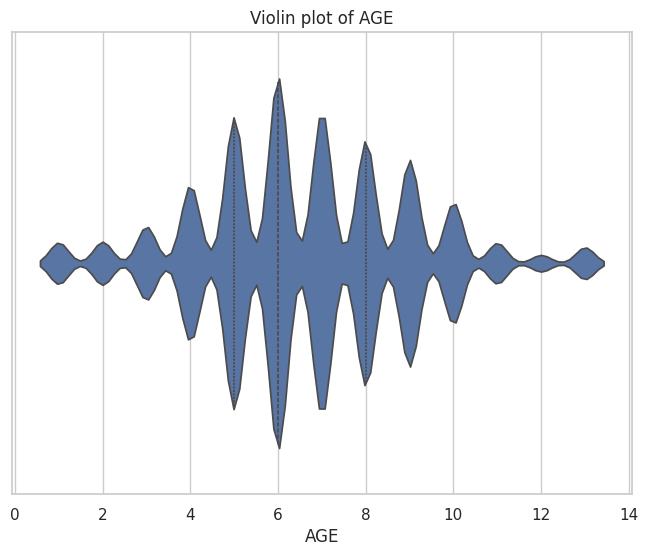

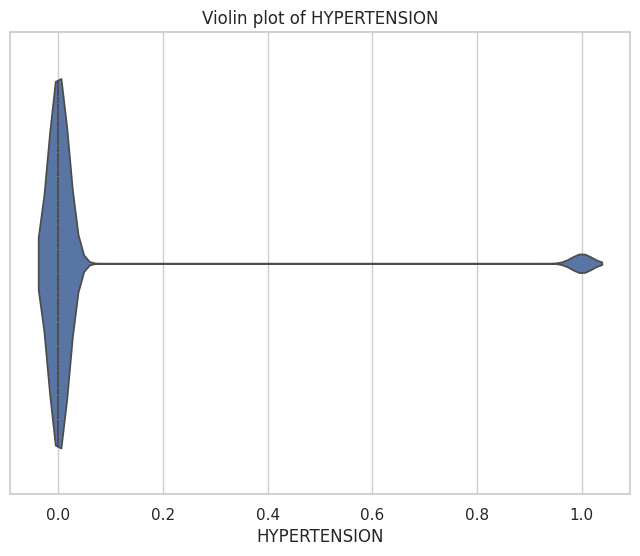

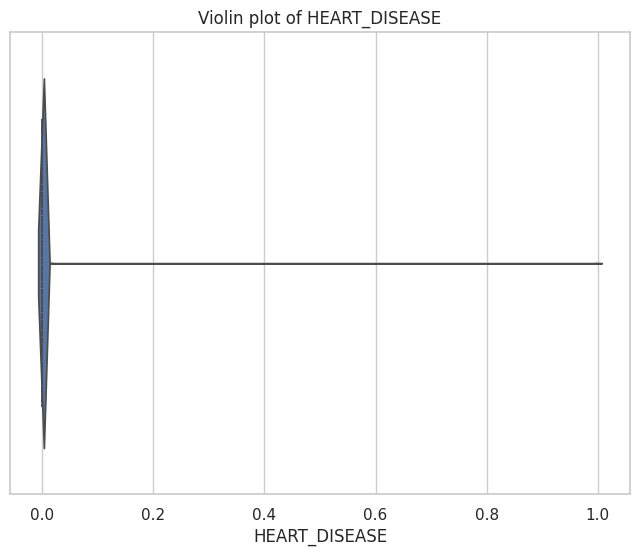

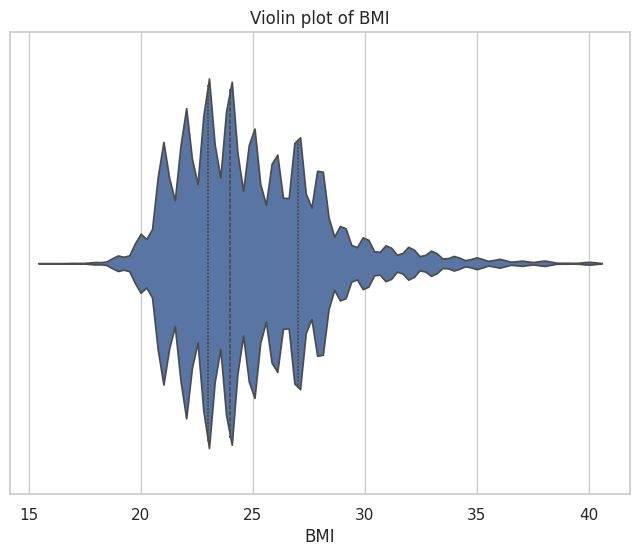

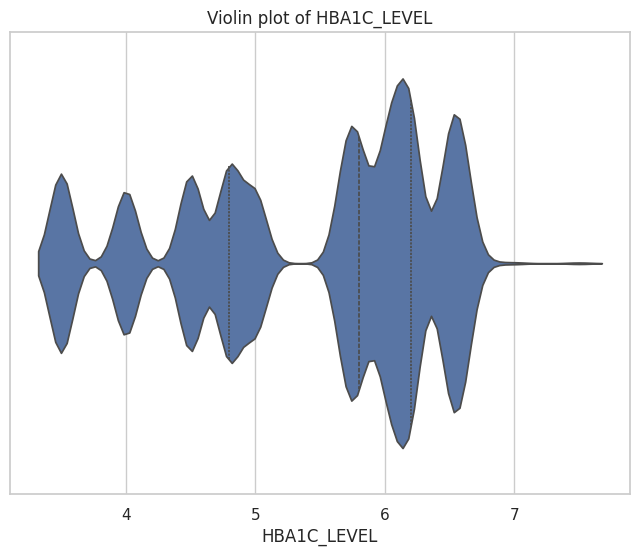

...

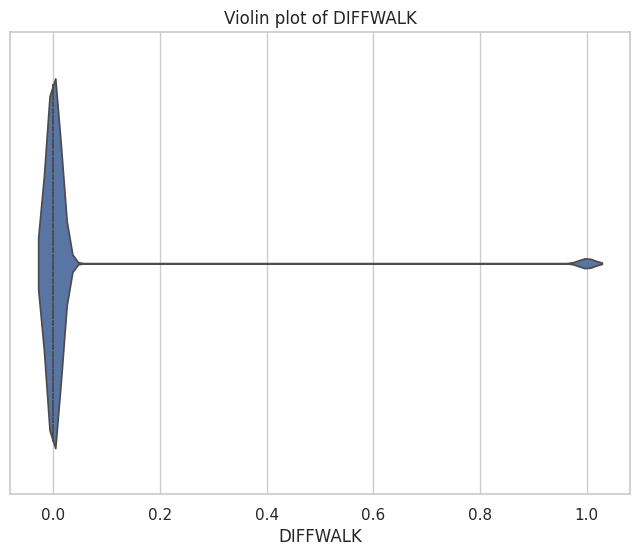

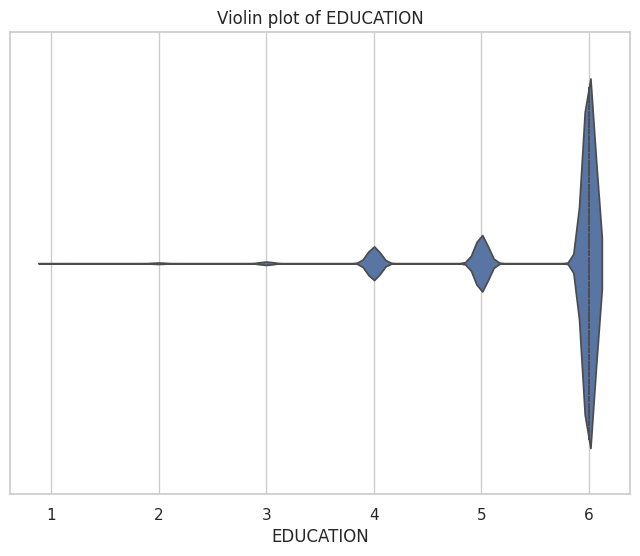

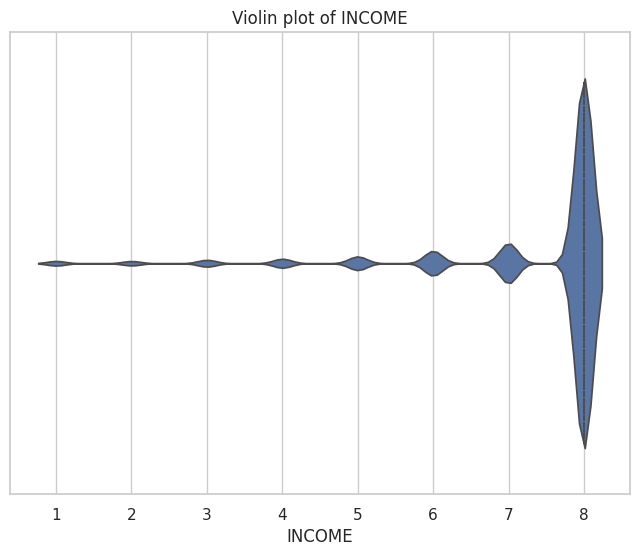

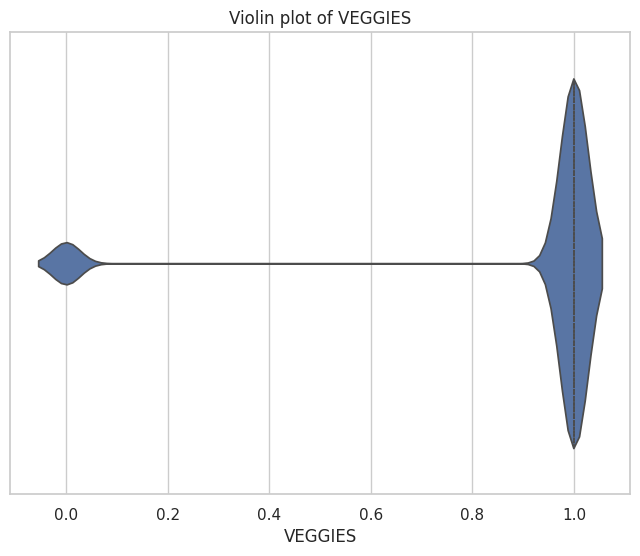

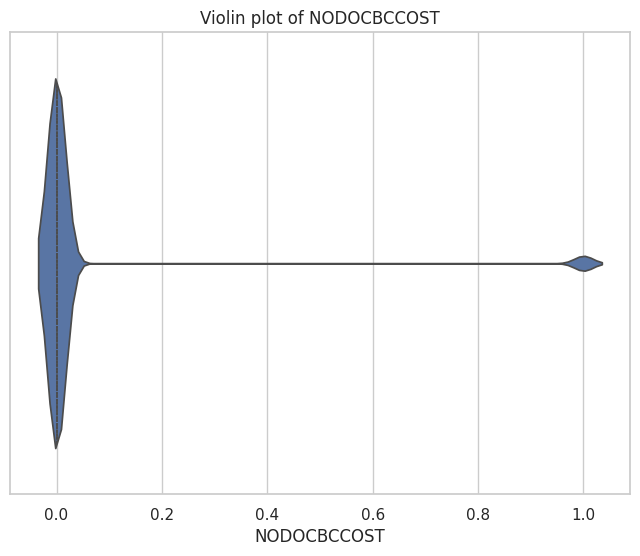

In [85]:
sns.set(style="whitegrid")

# Plot violin plots of numerical columns
numerical_cols = data_1_2_3.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.violinplot(x=data_1_2_3[col], inner="quartile")
    plt.title(f'Violin plot of {col}')
    plt.xlabel(col)
    plt.show()

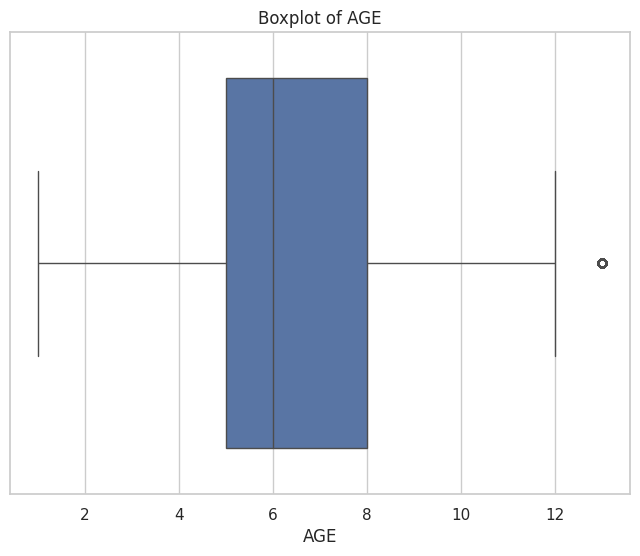

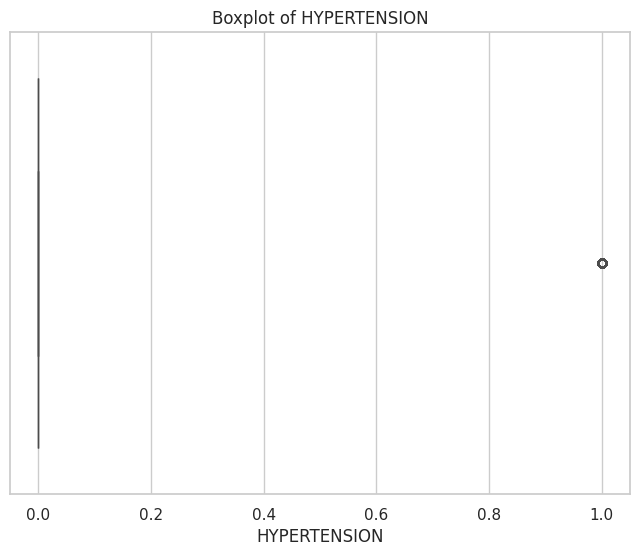

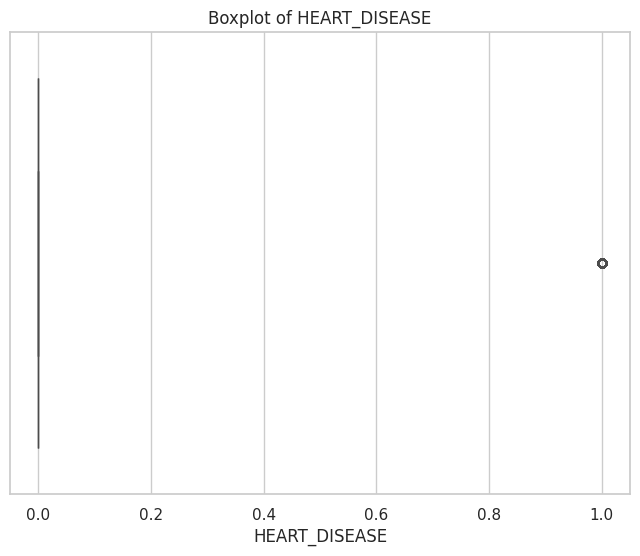

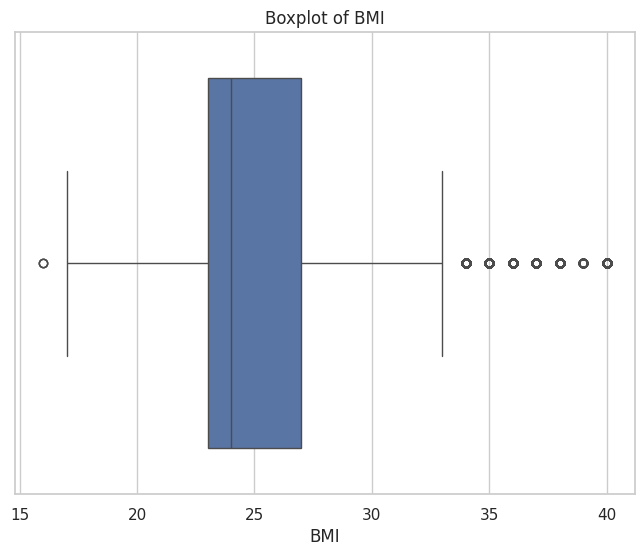

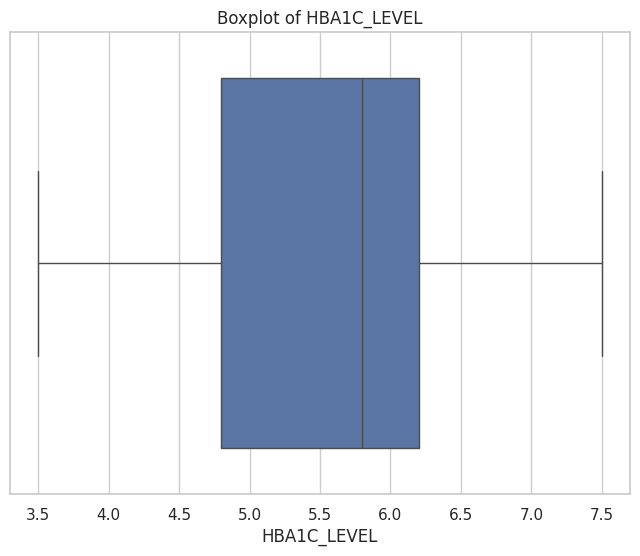

...

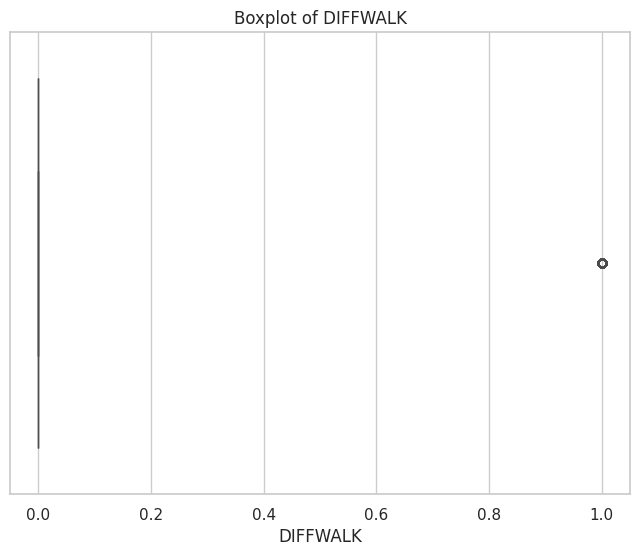

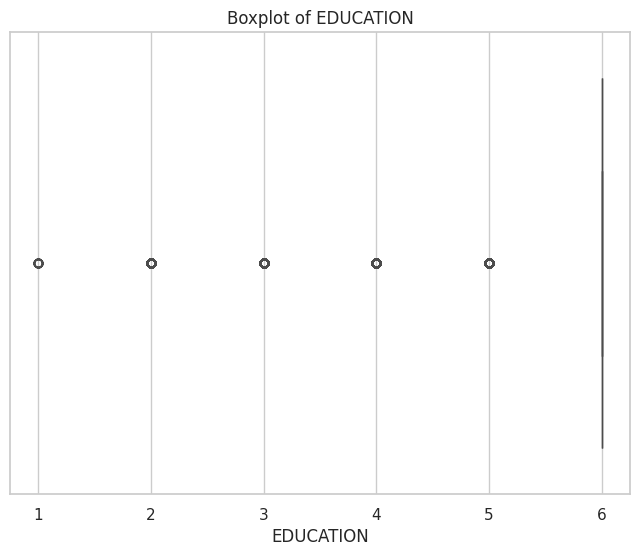

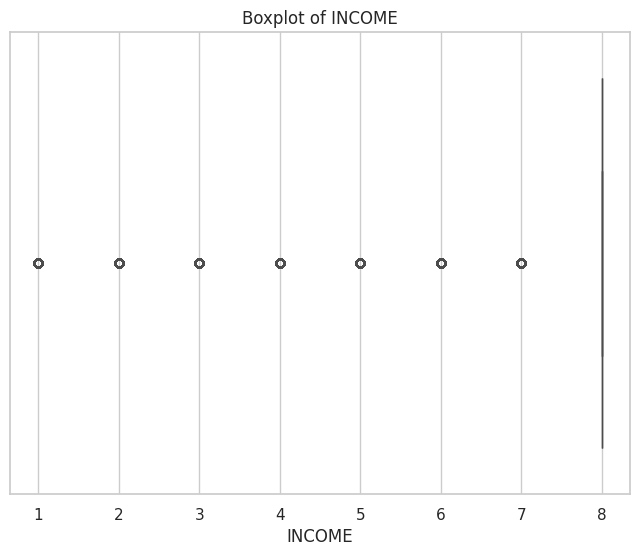

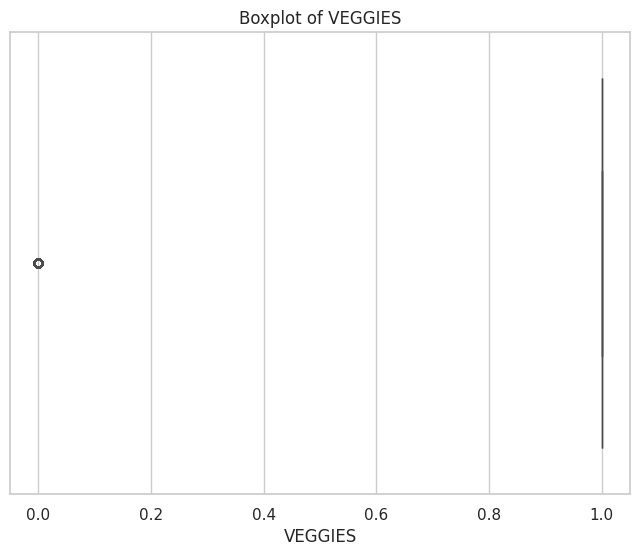

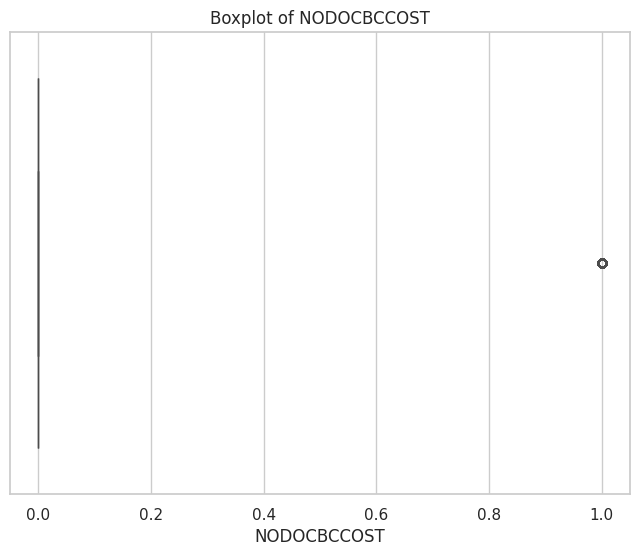

In [86]:
sns.set(style="whitegrid")

# Plot boxplots of numerical columns
numerical_cols = data_1_2_3.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=data_1_2_3[col])
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.show()

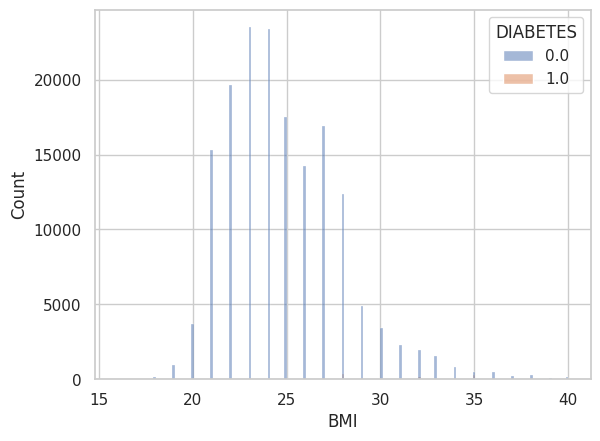

In [87]:
sns.histplot(data=data_1_2_3,x='BMI',hue='DIABETES')
plt.show()

## Outlier Detection and Removal

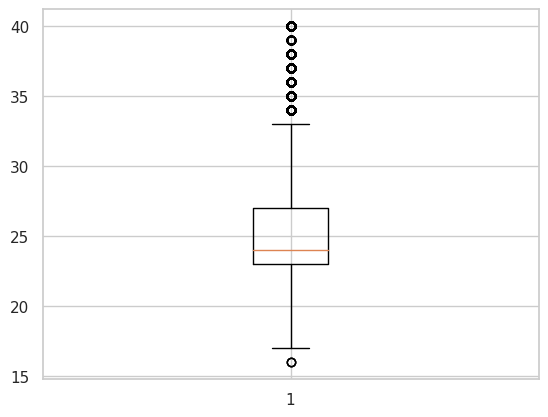

In [88]:
plt.boxplot(data_1_2_3['BMI'])
plt.show()

In [89]:
mean = data_1_2_3['BMI'].mean()
std  = data_1_2_3['BMI'].std()

# Calculate the lower and upper bounds
lower_bound = mean - std*2
upper_bound = mean + std*2

print('Lower Bound :',lower_bound)
print('Upper Bound :',upper_bound)

# Drop the outliers
data_1_2_3 = data_1_2_3[(data_1_2_3['BMI'] >= lower_bound)
                & (data_1_2_3['BMI'] <= upper_bound)]

Lower Bound : 18.492617571257203
Upper Bound : 31.293495045424518


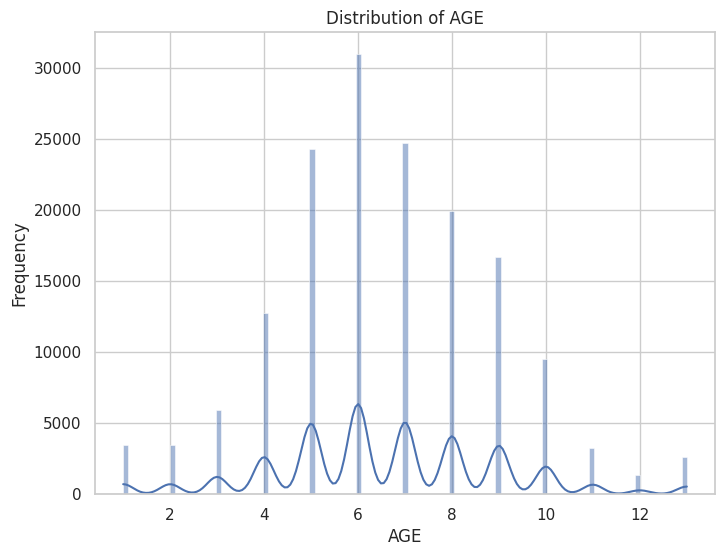

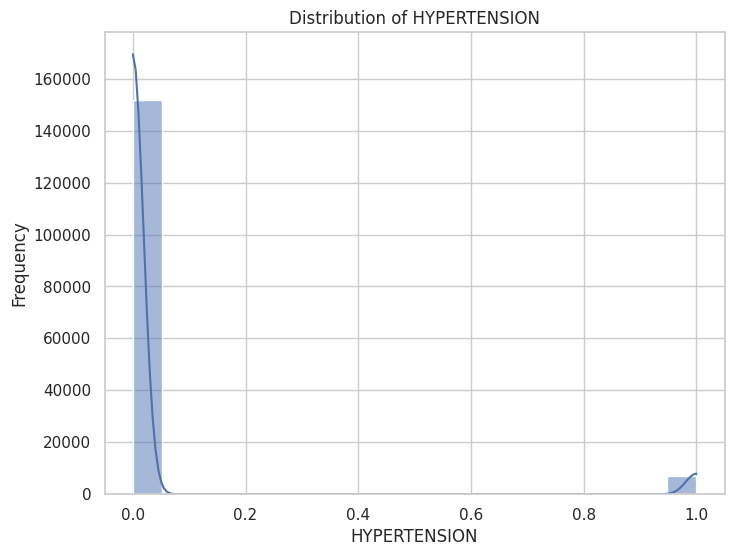

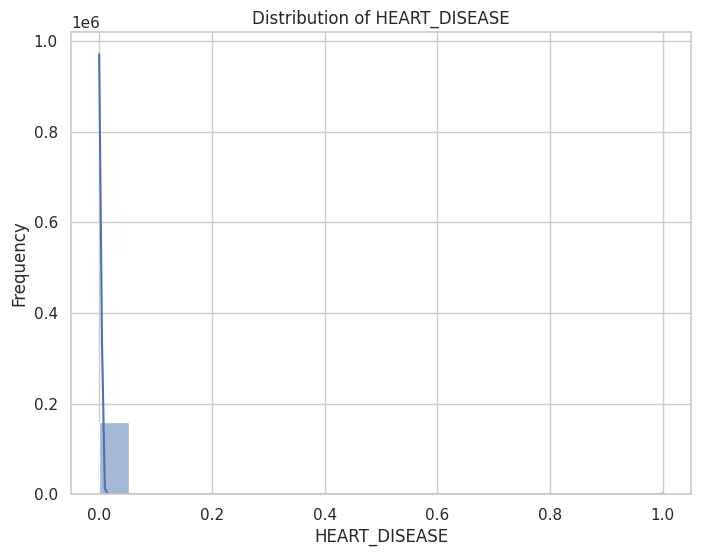

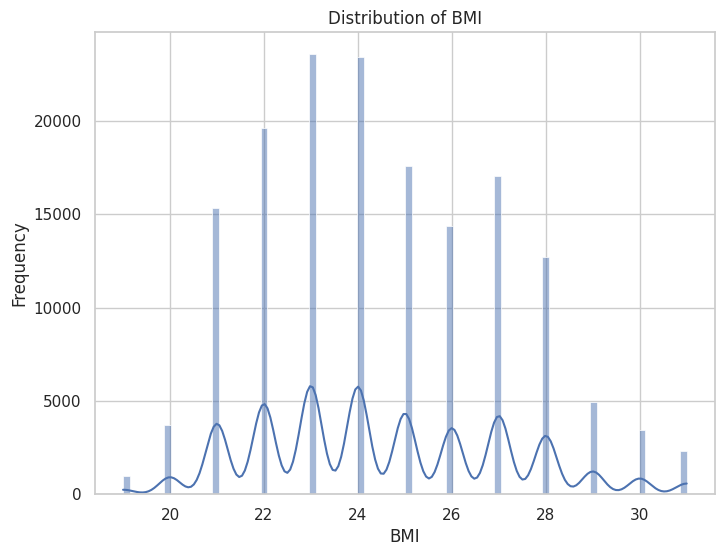

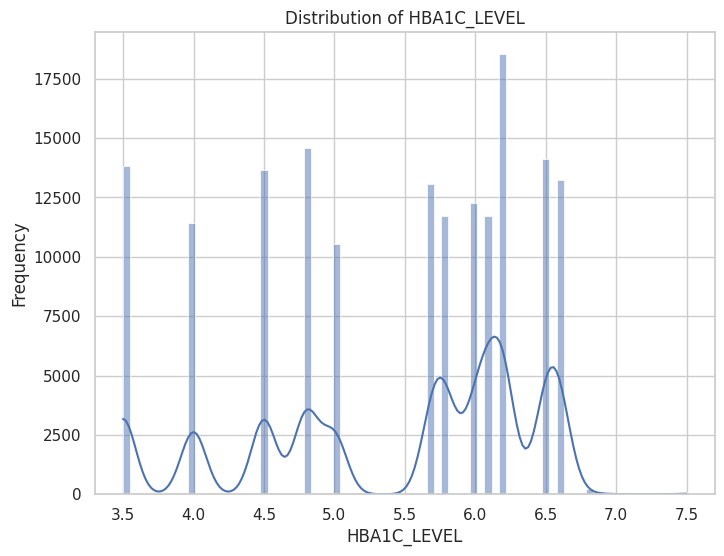

...

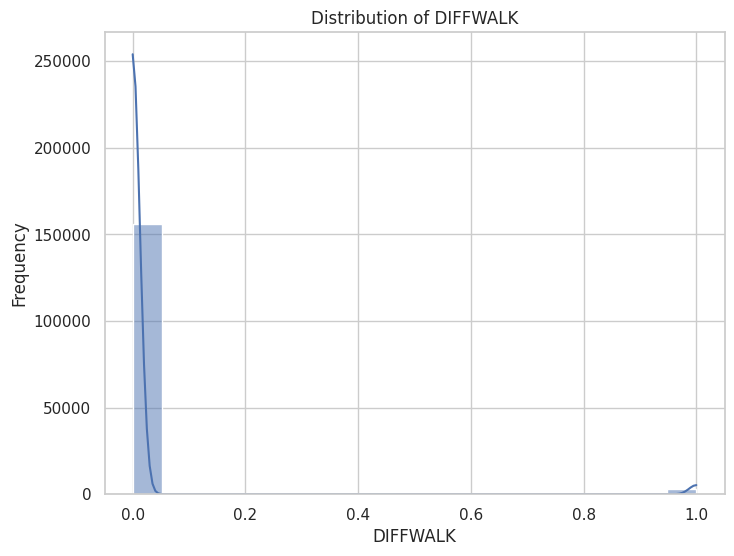

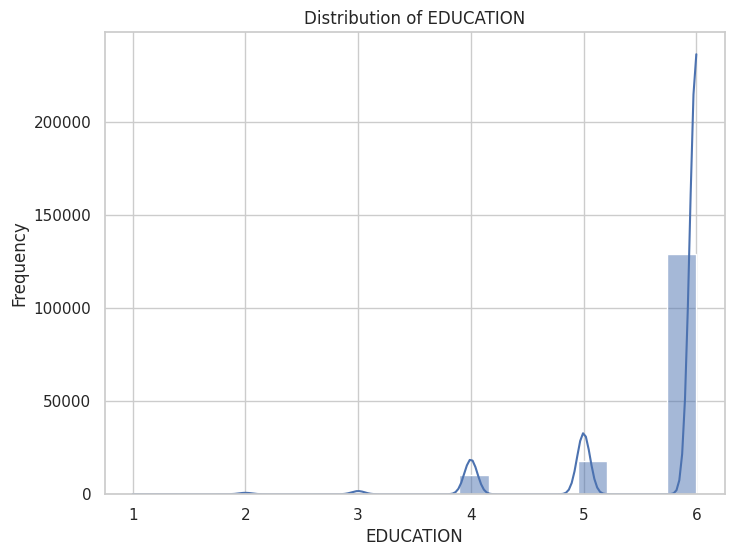

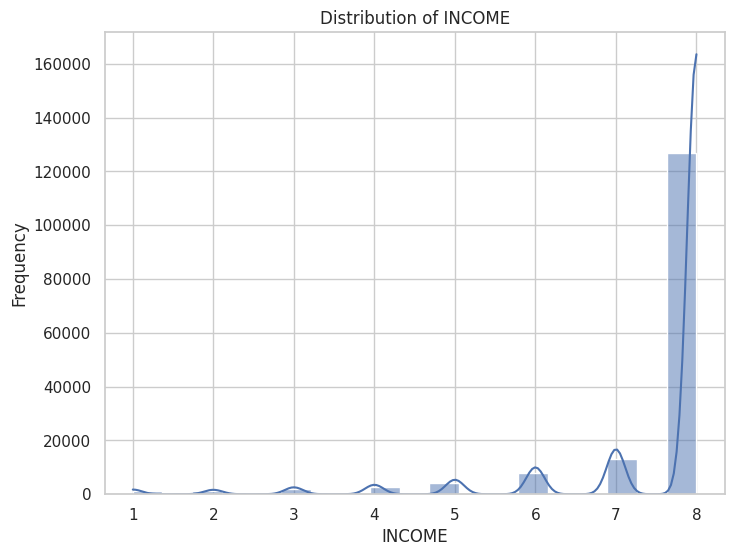

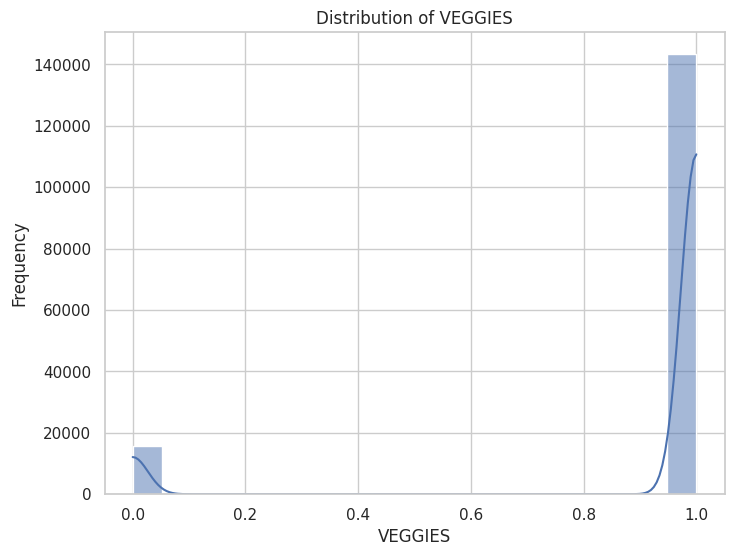

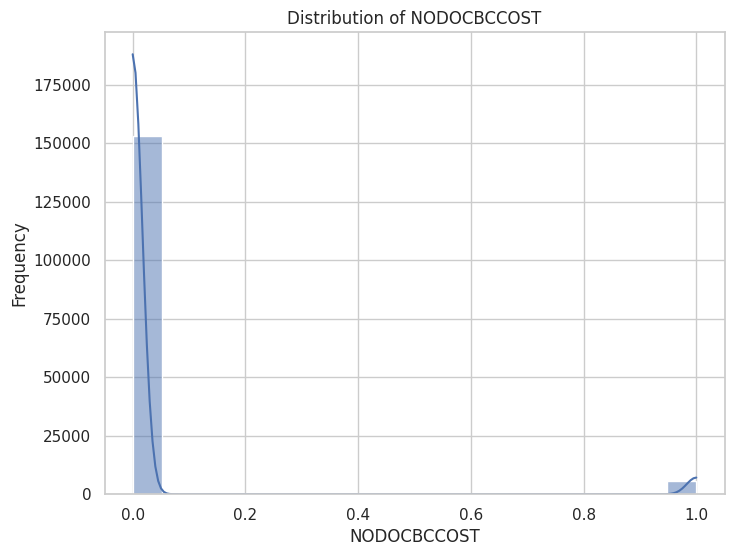

In [90]:
# Visualize the distribution of each numerical column
sns.set(style="whitegrid")

# Plot histograms of numerical columns
numerical_cols = data_1_2_3.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(data_1_2_3[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

## Checking Nulls and Duplicates and Dealing with them

In [91]:
data_1_2_3.isnull().sum()

AGE                    0
HYPERTENSION           0
HEART_DISEASE          0
BMI                    0
HBA1C_LEVEL            0
BLOOD_GLUCOSE_LEVEL    0
DIABETES               0
GENDER_MALE            0
SMOKER                 0
HIGHBP                 0
HIGHCHOL               0
CHOLCHECK              0
STROKE                 0
PHYSACTIVITY           0
FRUITS                 0
HVYALCOHOLCONSUMP      0
ANYHEALTHCARE          0
GENHLTH                0
MENTHLTH               0
PHYSHLTH               0
DIFFWALK               0
EDUCATION              0
INCOME                 0
VEGGIES                0
NODOCBCCOST            0
dtype: int64

In [92]:
data_1_2_3.duplicated().sum()

116886

In [93]:
data_1_2_3 = data_1_2_3.drop_duplicates()
print(f"No. of Duplcate rows after deleting duplicate rows: {data_1_2_3.duplicated().sum()}")

No. of Duplcate rows after deleting duplicate rows: 0


# Exploratory Data Analysis

In [94]:
# Display summary statistics for numerical columns
summary_stats = data_1_2_3.describe()
print(summary_stats)

                AGE  HYPERTENSION  HEART_DISEASE           BMI   HBA1C_LEVEL  \
count  42117.000000  42117.000000   42117.000000  42117.000000  42117.000000   
mean       6.979320      0.063870       0.005152     25.502505      5.403706   
std        3.165973      0.244524       0.071595      2.817514      0.997644   
min        1.000000      0.000000       0.000000     19.000000      3.500000   
25%        5.000000      0.000000       0.000000     23.000000      4.500000   
50%        7.000000      0.000000       0.000000     26.000000      5.800000   
75%        9.000000      0.000000       0.000000     28.000000      6.200000   
max       13.000000      1.000000       1.000000     31.000000      7.500000   

       BLOOD_GLUCOSE_LEVEL      DIABETES   GENDER_MALE        SMOKER  \
count         42117.000000  42117.000000  42117.000000  42117.000000   
mean            130.857848      0.018876      0.263457      0.209725   
std              34.089674      0.136089      0.440513      0.4

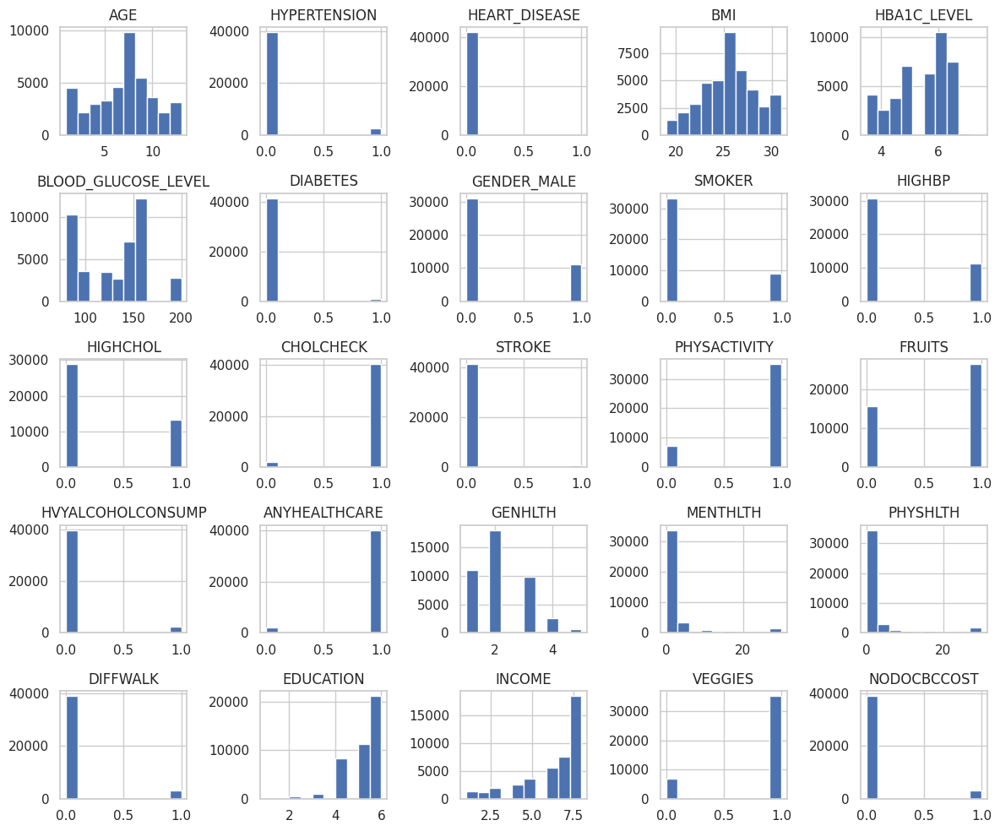

In [95]:
# Plot histograms of numerical columns
data_1_2_3.hist(figsize=(12, 10))
plt.tight_layout()
plt.show()

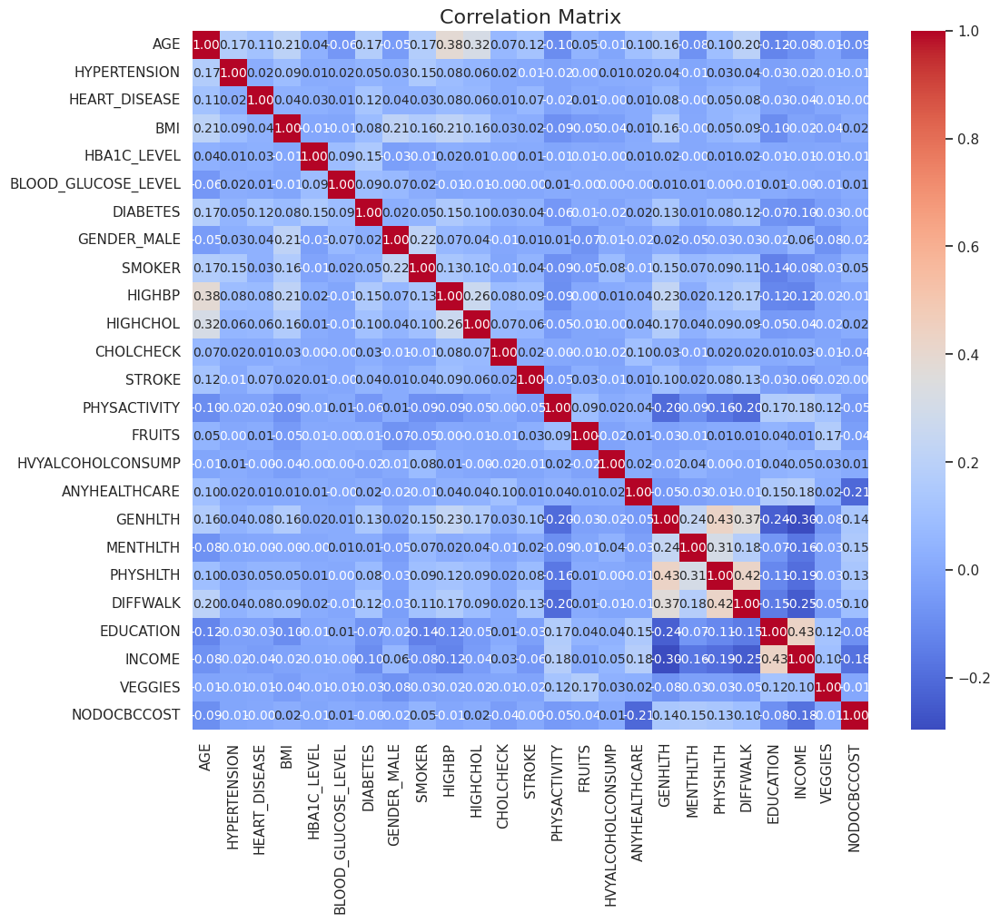

In [96]:
corr_matrix = data_1_2_3.corr()

# Plot correlation matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title("Correlation Matrix", fontsize=16)
plt.show()

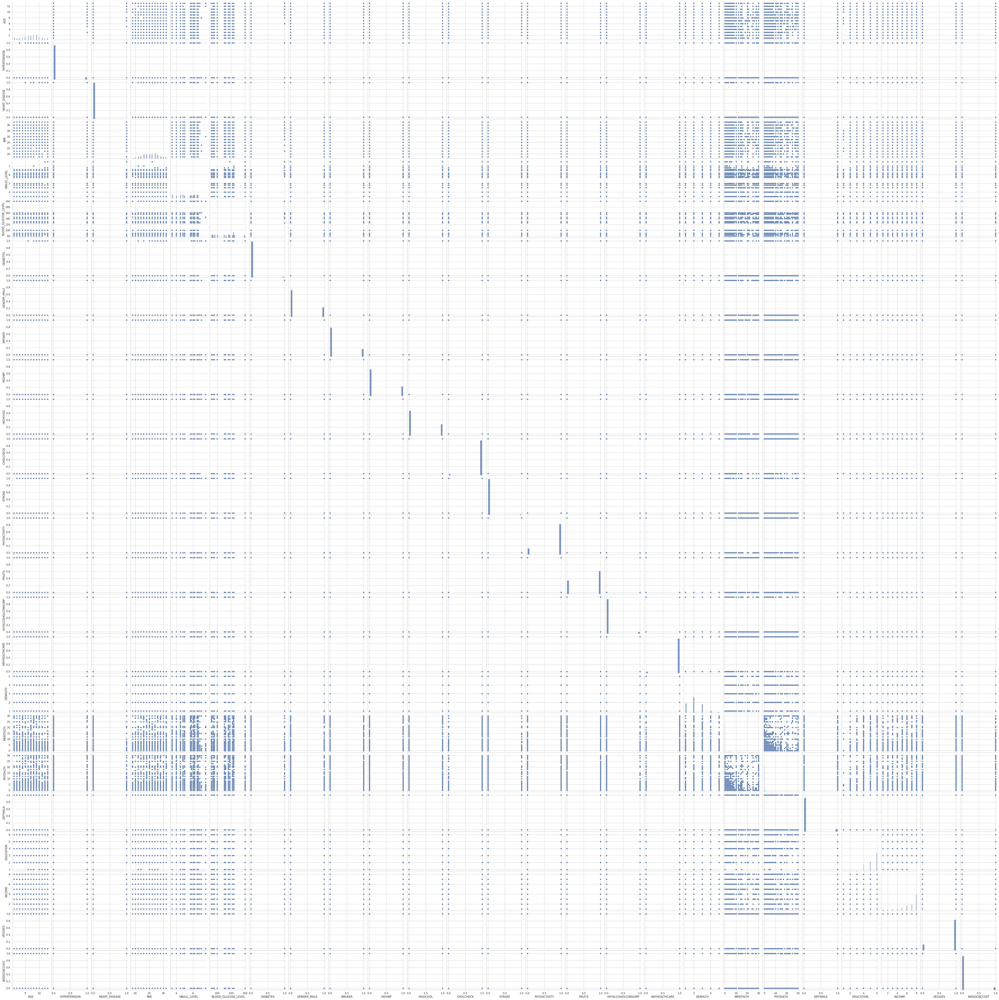

In [97]:
# Plot pairwise relationships in the dataset
sns.pairplot(data_1_2_3)
plt.show()

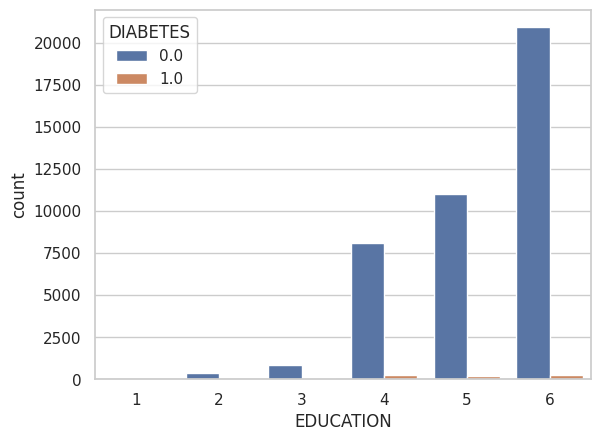

In [98]:
sns.countplot(x='EDUCATION',hue="DIABETES",data=data_1_2_3);

From Above Graph,Specially seeing the last three bars we Can Conclude that Education Doesn't effect Diabetes beacuse with increase in counts the diabetes persons counts remains constant.

In [99]:
import plotly.express as px

px.violin(data_1_2_3,
             x='MENTHLTH',
             y='PHYSHLTH',
             title='MENTHLTH Vs PHYSHLTH',
             color='DIABETES')

From above violin plot we can say that Mental health doesn't much effect on diabetes while the physical health have considerable effect on the diabetes.

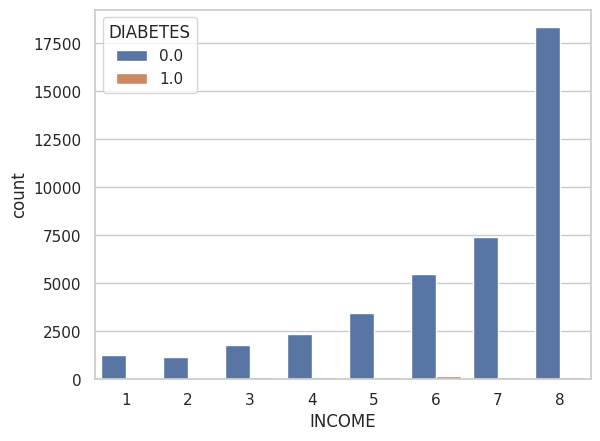

In [100]:
sns.countplot(x='INCOME',hue='DIABETES',data=data_1_2_3);

From above count plot, it is clear that income doesn't have an effect on diabetes beacuse with increase in income diabetes doesn't increases by a considrable amount.

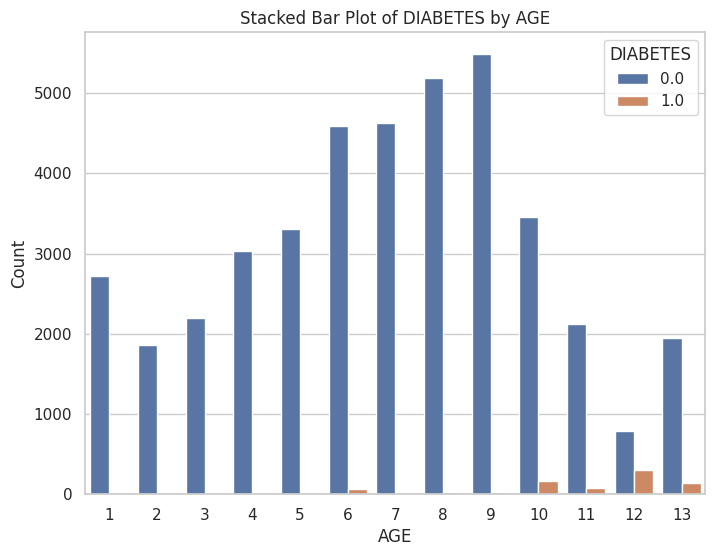

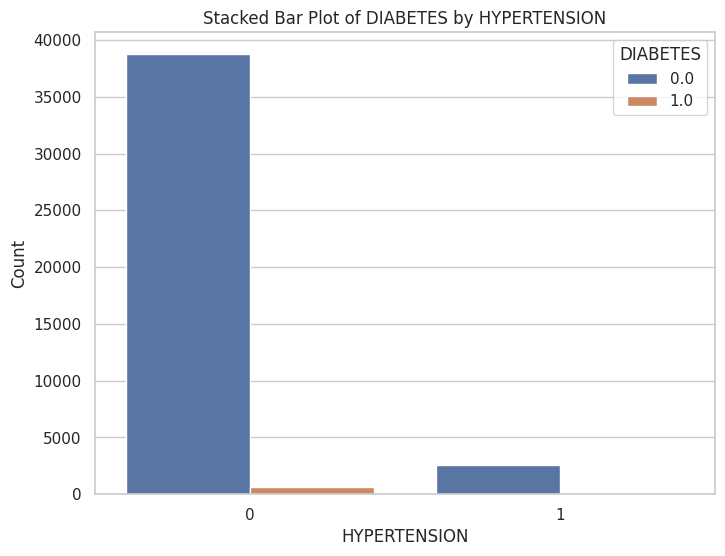

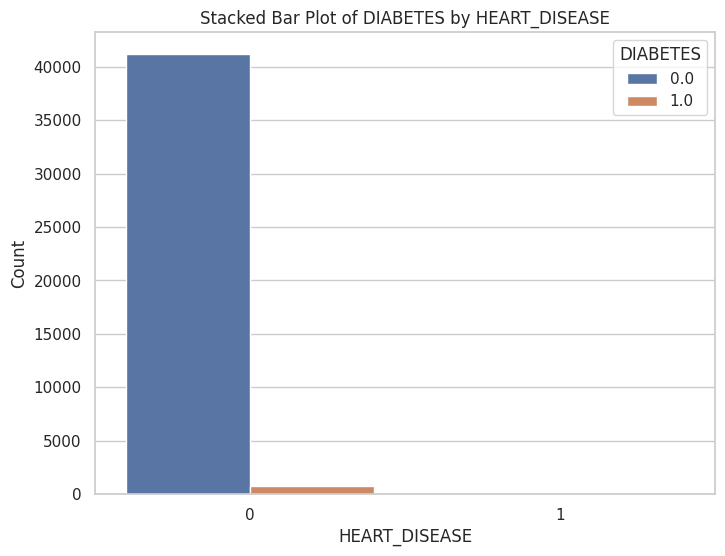

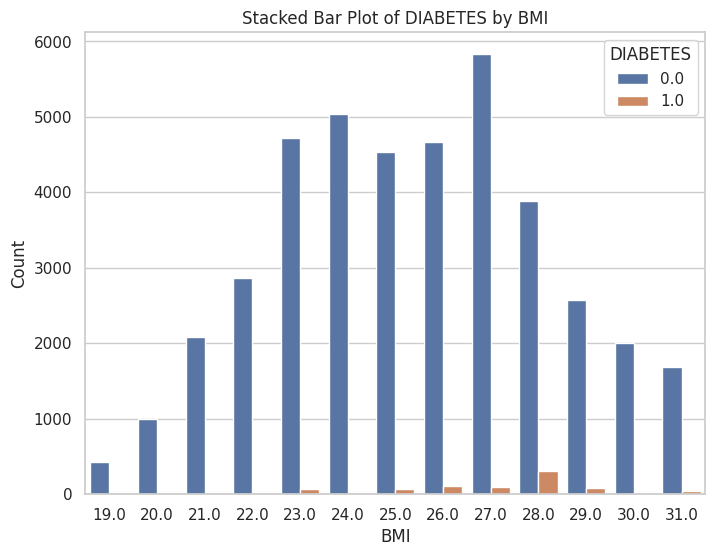

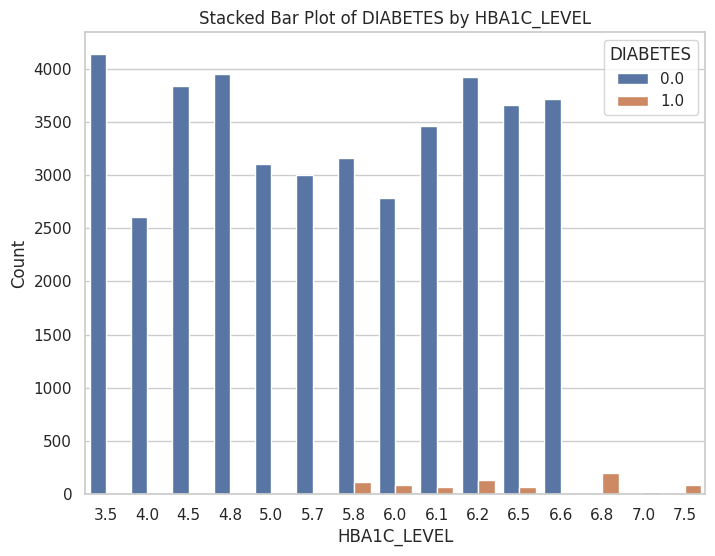

...

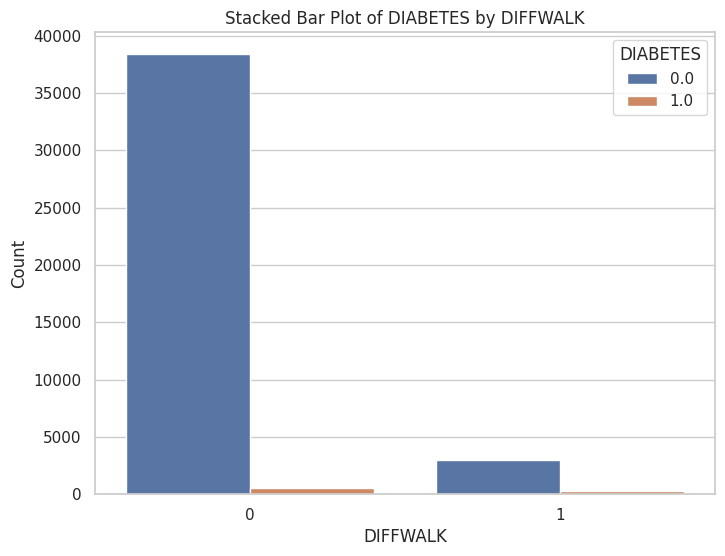

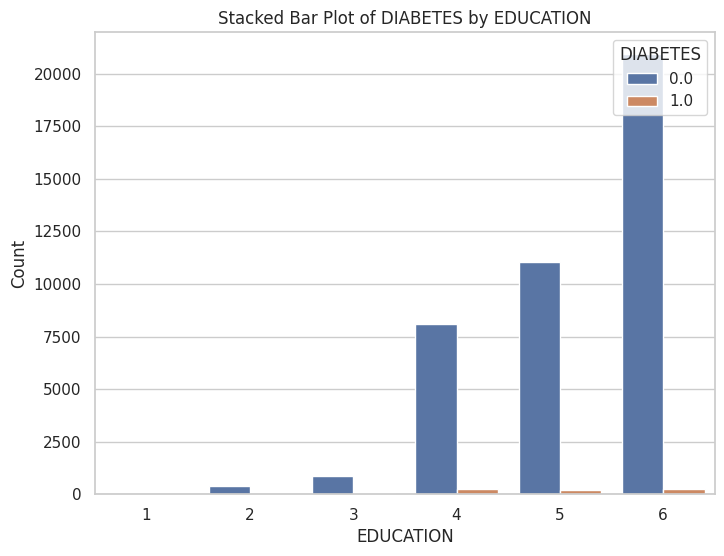

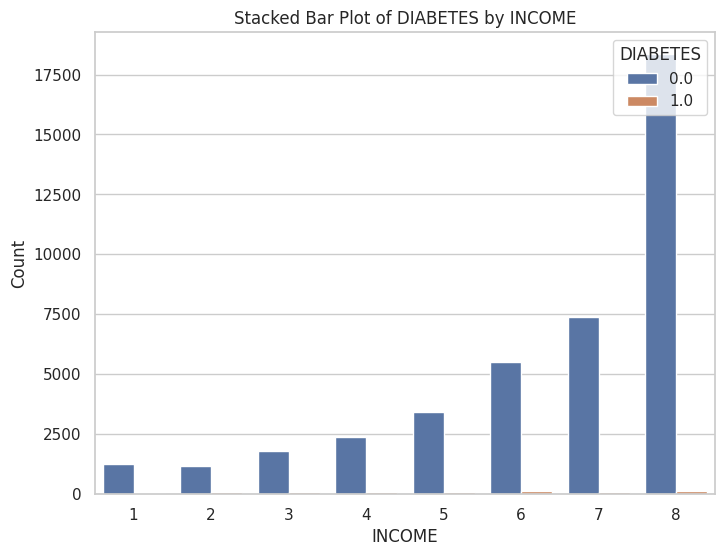

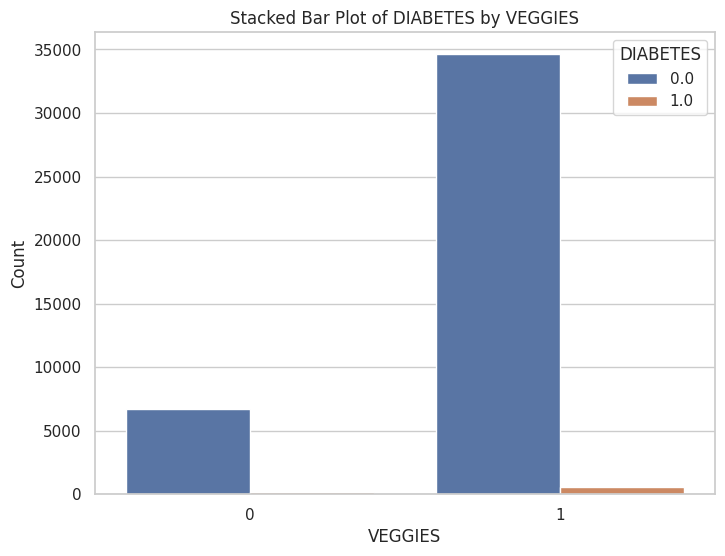

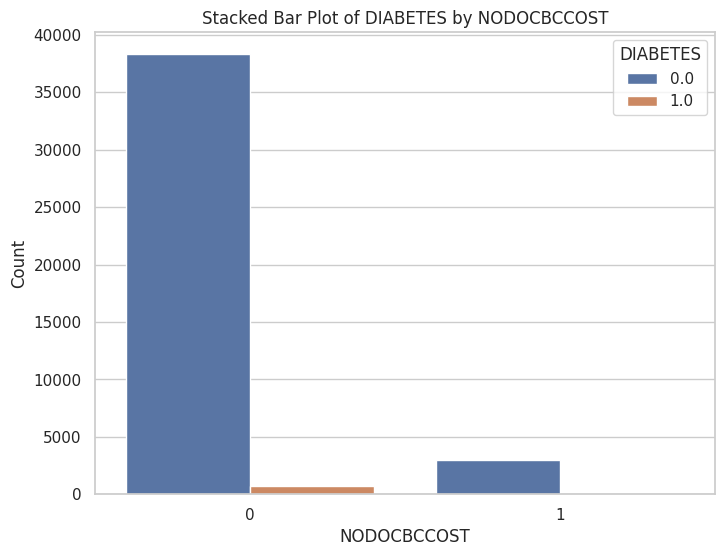

In [101]:
# Select numerical columns
numerical_columns = data_1_2_3.select_dtypes(include=['int64', 'float64']).columns

# Plot stacked bar plots for each numerical column
for col in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=col, hue='DIABETES', data=data_1_2_3)
    plt.title(f'Stacked Bar Plot of DIABETES by {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.legend(title='DIABETES', loc='upper right')
    plt.show()

# Logistic Regression Model

In [102]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Step 1: Split the data into training and testing sets
X = data_1_2_3.drop(columns=['DIABETES'])  # Features
y = data_1_2_3['DIABETES']  # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 2: Initialize and train the logistic regression model
model = LogisticRegression()
model.fit(X_train, y_train)

# Step 3: Make predictions on the testing data
y_pred = model.predict(X_test)

# Step 4: Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

Accuracy: 0.9791073124406457

Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      8254
         1.0       0.35      0.04      0.07       170

    accuracy                           0.98      8424
   macro avg       0.67      0.52      0.53      8424
weighted avg       0.97      0.98      0.97      8424


Confusion Matrix:
[[8241   13]
 [ 163    7]]


In [103]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.linear_model import LogisticRegression

# Oversample the minority class
oversampler = RandomOverSampler(random_state=42)
X_resampled_over, y_resampled_over = oversampler.fit_resample(X_train, y_train)

# Undersample the majority class
undersampler = RandomUnderSampler(random_state=42)
X_resampled_under, y_resampled_under = undersampler.fit_resample(X_train, y_train)

# Use class weights with logistic regression
log_reg = LogisticRegression(class_weight='balanced', random_state=42)

# Fit logistic regression on oversampled data
log_reg.fit(X_resampled_over, y_resampled_over)

# Fit logistic regression on undersampled data
log_reg.fit(X_resampled_under, y_resampled_under)

# Predict on the test data
y_pred = log_reg.predict(X_test)

# Evaluate the performance
print("Accuracy:", accuracy_score(y_test, y_pred))

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix

print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1-score:", f1_score(y_test, y_pred))

# Generate classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Generate confusion matrix
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Accuracy: 0.8395061728395061
Precision: 0.10121457489878542
Recall: 0.8823529411764706
F1-score: 0.18159806295399517

Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      0.84      0.91      8254
         1.0       0.10      0.88      0.18       170

    accuracy                           0.84      8424
   macro avg       0.55      0.86      0.55      8424
weighted avg       0.98      0.84      0.90      8424


Confusion Matrix:
[[6922 1332]
 [  20  150]]


In [104]:
threshold = 0.3  # Example threshold value
y_pred_proba = log_reg.predict_proba(X_test)[:, 1]  # Predicted probabilities for class 1
y_pred_threshold = (y_pred_proba >= threshold).astype(int)  # Convert probabilities to binary predictions

# Evaluate the performance with adjusted threshold
print("Adjusted Threshold:")
print("Accuracy:", accuracy_score(y_test, y_pred_threshold))
print("Precision:", precision_score(y_test, y_pred_threshold))
print("Recall:", recall_score(y_test, y_pred_threshold))
print("F1-score:", f1_score(y_test, y_pred_threshold))

Adjusted Threshold:
Accuracy: 0.7447768281101614
Precision: 0.06881533101045297
Recall: 0.9294117647058824
F1-score: 0.1281427412814274


In [105]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation
cv_scores = cross_val_score(log_reg, X_train, y_train, cv=5)

# Print cross-validation scores
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Accuracy:", np.mean(cv_scores))

Cross-Validation Scores: [0.83706781 0.85086808 0.84092595 0.84016028 0.83644999]
Mean CV Accuracy: 0.8410944238097674


In [106]:
from sklearn.model_selection import GridSearchCV

# Define hyperparameters to tune
param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}

# Instantiate GridSearchCV
grid_search = GridSearchCV(log_reg, param_grid, cv=5, scoring='accuracy')

# Fit grid search to the data
grid_search.fit(X_train, y_train)

# Print best hyperparameters
print("Best Hyperparameters:", grid_search.best_params_)

Best Hyperparameters: {'C': 0.1}


In [ ]:
from imblearn.over_sampling import SMOTE

# Instantiate SMOTE
smote = SMOTE(random_state=42)

# Oversample the minority class
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [ ]:
# Train the model with best hyperparameters
best_log_reg = LogisticRegression(C=1, class_weight='balanced', random_state=42)
best_log_reg.fit(X_train_resampled, y_train_resampled)

In [109]:
# Predict on the test data
y_pred_test = best_log_reg.predict(X_test)

# Evaluate the performance on test data
print("Test Accuracy:", accuracy_score(y_test, y_pred_test))
print("Test Precision:", precision_score(y_test, y_pred_test))
print("Test Recall:", recall_score(y_test, y_pred_test))
print("Test F1-score:", f1_score(y_test, y_pred_test))

Test Accuracy: 0.8588556505223172
Test Precision: 0.10473235065942592
Test Recall: 0.7941176470588235
Test F1-score: 0.18505825908156273
Test Accuracy: 0.8588556505223172
Test Precision: 0.10473235065942592
Test Recall: 0.7941176470588235
Test F1-score: 0.18505825908156273


# Error Analysis

In [110]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error (MAE):", mae)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)

# Calculate Root Mean Squared Error (RMSE)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print("Root Mean Squared Error (RMSE):", rmse)

Mean Absolute Error (MAE): 0.16049382716049382
Mean Squared Error (MSE): 0.16049382716049382
Root Mean Squared Error (RMSE): 0.40061680838488767


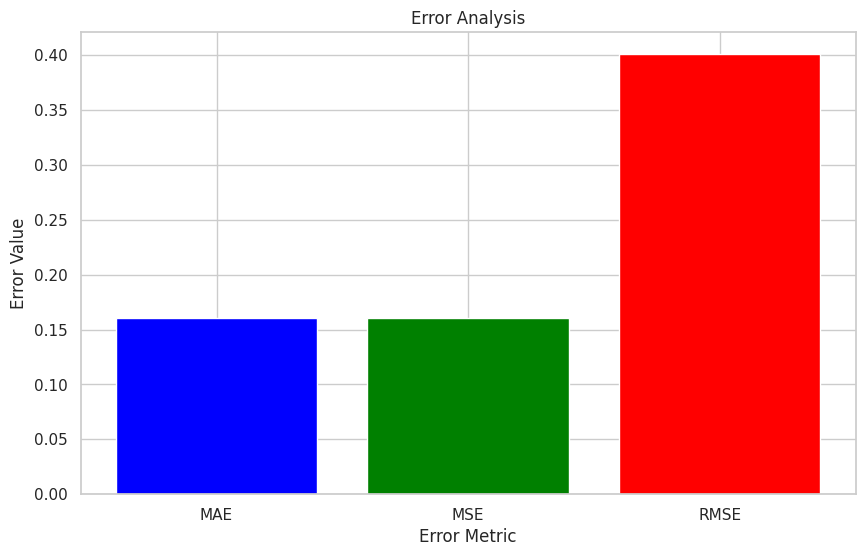

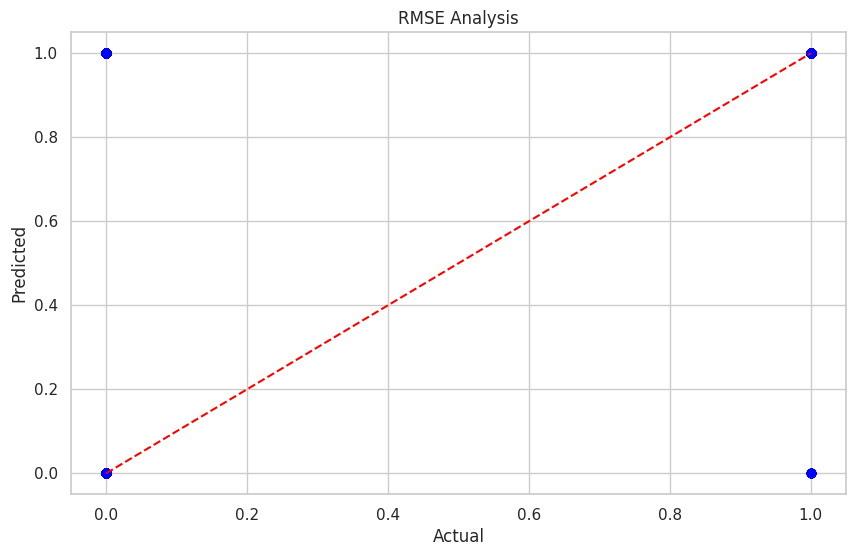

In [111]:
import matplotlib.pyplot as plt

# Calculate errors
errors = {'MAE': mae, 'MSE': mse, 'RMSE': rmse}

# Plot MAE and MSE
plt.figure(figsize=(10, 6))
plt.bar(errors.keys(), errors.values(), color=['blue', 'green', 'red'])
plt.xlabel('Error Metric')
plt.ylabel('Error Value')
plt.title('Error Analysis')
plt.show()

# Plot RMSE
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('RMSE Analysis')
plt.show()

In [112]:
y_pred = model.predict(X_test)

In [113]:
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[8241   13]
 [ 163    7]]


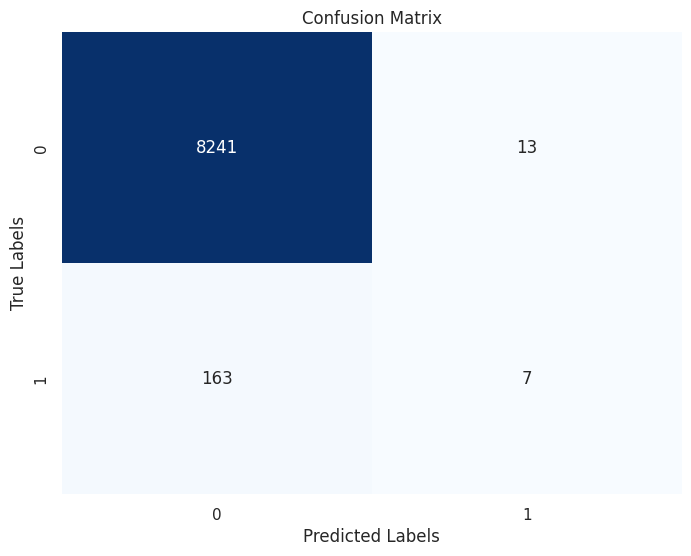

In [114]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [115]:
from sklearn.metrics import classification_report

print("Classification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      8254
         1.0       0.35      0.04      0.07       170

    accuracy                           0.98      8424
   macro avg       0.67      0.52      0.53      8424
weighted avg       0.97      0.98      0.97      8424



In [116]:
# Get indices of misclassified samples
misclassified_idx = (y_test != y_pred)

# Display misclassified samples
misclassified_samples = X_test[misclassified_idx]
print("Misclassified Samples:")
print(misclassified_samples)

Misclassified Samples:
        AGE  HYPERTENSION  HEART_DISEASE   BMI  HBA1C_LEVEL  \
83143    13             0              0  24.0          6.2   
18468    10             0              0  28.0          6.2   
159325   12             0              0  27.0          6.8   
54859    10             0              0  28.0          5.8   
54866    10             0              0  28.0          5.8   
...     ...           ...            ...   ...          ...   
159412   12             0              0  27.0          6.8   
79483     6             0              0  30.0          6.0   
161761   11             0              1  28.0          6.1   
13710     6             0              0  26.0          6.1   
113581   12             1              0  29.0          6.2   

        BLOOD_GLUCOSE_LEVEL  GENDER_MALE  SMOKER  HIGHBP  HIGHCHOL  ...  \
83143                   160            1       0       1         1  ...   
18468                   160            0       1       1         1  ..